# Weather Prediction from Image

<ol>
    <li>Dinesh Goutham Gandla (UC05573)</li>
    <li>Lokesh Rachakonda (HD97936)</li>
    <li>Bharath Kumar Atigadda (GX86058)</li>
    <li>Sai Sujith Reddy Chagam (XF15736)</li>
    <li>Kiran Kumar Reddy Guggilla (DE14051)</li>
</ol>

# Problem Significance 

**The reason we chose this particular project was we are really facinated by the autunomus self driving technology and how they can predict real time weather changes and drive safely according to weather.**


**So as we are dealing with image processing and prediction Deep learning is the best way to predict optimum results. So in this prticular weather prediction we are using Convolutional Neural Networks to preict the weather for the given weather images.**

**Importing all the required libraries**

**We are choosing TensorFlow over pyTorch as TF provides several optimizing techniques to imporve the model performance**

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from PIL import Image, ImageEnhance
from tqdm import tqdm
import random
import glob


import cv2
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from sklearn import metrics
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from sklearn.utils import class_weight 
from keras.layers import Add, Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation


%matplotlib inline

# Computational Power

**It was taking us a long time to process the data while data augmentation so we leveraged the computational power provided by Kaggle's free GPU for up to 30 hours to finish the project.**

**load all the images from different folders and label with their corresponding labels**

In [2]:
path = '/kaggle/input/weather-dataset/dataset'
path_imgs = list(glob.glob(path+'/**/*.jpg'))

In [3]:
labels = list(map(lambda x:os.path.split(os.path.split(x)[0])[1], path_imgs))
file_path = pd.Series(path_imgs, name='File_Path').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([file_path, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head()

,File_Path,Labels
0,/kaggle/input/weather-dataset/dataset/sandstor...,sandstorm
1,/kaggle/input/weather-dataset/dataset/dew/2505...,dew
2,/kaggle/input/weather-dataset/dataset/rain/166...,rain
3,/kaggle/input/weather-dataset/dataset/rime/495...,rime
4,/kaggle/input/weather-dataset/dataset/rime/535...,rime


# EDA

Lets load some sample images

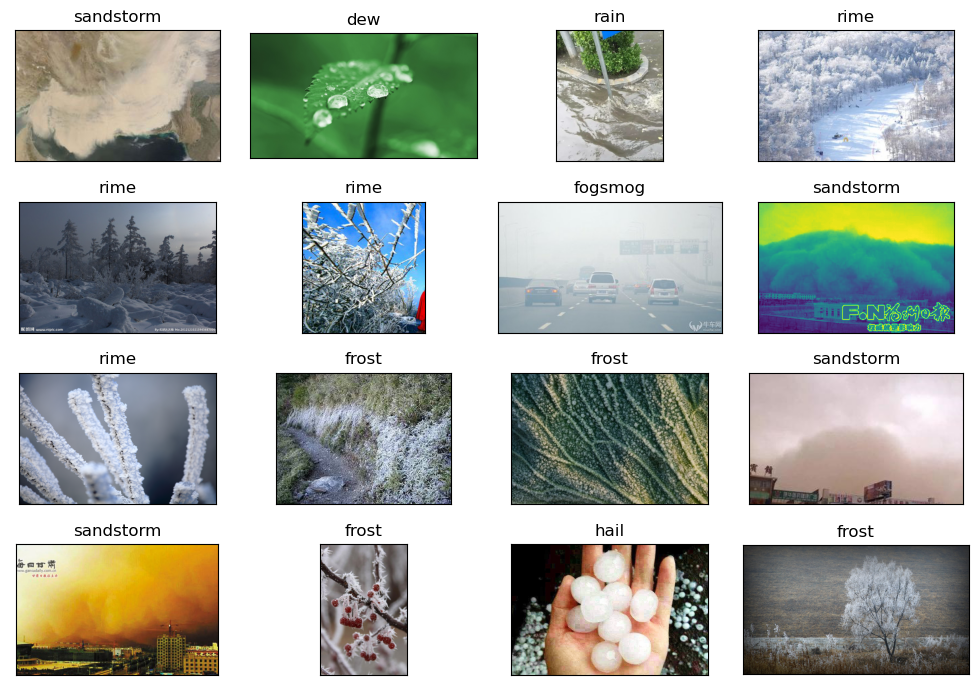

In [4]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data.File_Path[i]))
    ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()

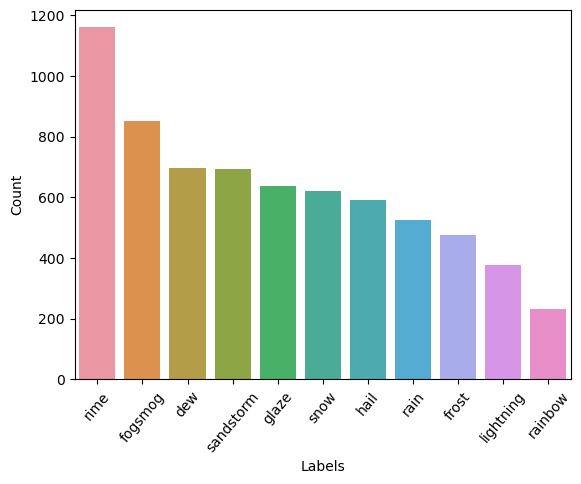

In [5]:
counts = data.Labels.value_counts()
sns.barplot(x=counts.index, y=counts)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=50);

# Nature of Classification

**This particular task presents an unbalanced multi-class classification problem. We are dealing with 11 distinct target classes, namely dew, fog/smog, frost, glaze, hail, lightning, rain, rainbow, rime, sandstorm, and snow.**

# Majority and Minority Clasess

**From the above class distribution it is cleaar that Rime is the majority class and Rainbow is the minority class. Moreover, we maight observe some varience for the minority class during the performnace evluation for differrnt models.**

# Data Augmentation and Train/Test Split

**Lets spit the dataset into train,validatation and test with the ratios of 70,10,20 respectively**

In [6]:
train_df, test_df = train_test_split(data, test_size=0.2, random_state=2)
train_df, valid_df = train_test_split(train_df, test_size=0.1, random_state=2)

In [7]:
def gen(pre,train,valid,test):
    train_datagen = ImageDataGenerator(preprocessing_function=pre, validation_split=0.2)
    test_datagen = ImageDataGenerator(preprocessing_function=pre)
    
    train_gen = train_datagen.flow_from_dataframe(dataframe=train,x_col='File_Path',y_col='Labels', target_size=(100,100),class_mode='categorical',batch_size=32,shuffle=False,
                seed=0,
                rotation_range=30,zoom_range=0.15,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.15,horizontal_flip=True,fill_mode="nearest")
    
    valid_gen = train_datagen.flow_from_dataframe(dataframe=valid,x_col='File_Path',y_col='Labels',target_size=(100,100),class_mode='categorical',batch_size=32,
                shuffle=False,seed=0,
                rotation_range=30,zoom_range=0.15,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.15,horizontal_flip=True,fill_mode="nearest")
    
    test_gen = test_datagen.flow_from_dataframe(dataframe=test,x_col='File_Path',y_col='Labels',target_size=(100,100),color_mode='rgb',class_mode='categorical',
              batch_size=32,verbose=1,shuffle=False)
    
    return train_gen, valid_gen, test_gen

# Data Augmentation:

- **Batch Size**: During training, the dataset is divided into multiple batches, and each batch is fed into the model to compute the loss and update the model's parameters. We have tried multiple batch sizes. However, we have limited data set containing  around 6000 images and for better performance we have chose our batch size as 32.


- **Image Size**: Our image size is 100*100 pixes


- **Augmentation process**: we have applied random transformations to the training data to create new variations of the original images to simulate real-world scenarios and help improve the model's generalization ability. we chose rotaated our image 30 degrees, and performed some more modifications such as zooming, flipping the image and others.

In [8]:
def func(name_model):
    pre_model = name_model(input_shape=(100,100, 3),include_top=False,weights='imagenet',pooling='avg')

    pre_model.trainable = False

    inputs = pre_model.input
    x = Dense(100, activation='relu')(pre_model.output)
    x = Dense(100, activation='relu')(x)
    outputs = Dense(11, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss = 'categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])
    my_callbacks  = [EarlyStopping(monitor='val_loss',min_delta=0,patience=10,mode='auto')]
    
    return model, my_callbacks

**This function creates a neural network model by combining a pre-trained model as a feature extractor with additional layers for classification. The pre-trained weights are frozen to prevent them from being updated during training, and only the weights of the new layers are learned.**


**Two fully connected layers with 100 units each and ReLU activation are added to the model architecture. The output of the previous layer serves as the input to these dense layers.**

**The model is compiled using categorical cross-entropy as the loss function, Adam as the optimizer, and accuracy as the metric to monitor during training.**

In [9]:
def plot(history,train_gen,valid_gen,test_gen,model):

    #################################################################  
    # Plotting Accuracy, val_accuracy, loss, val_loss
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax = ax.ravel()

    for i, met in enumerate(['accuracy', 'loss']):
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('Model {}'.format(met))
        ax[i].set_xlabel('epochs')
        ax[i].set_ylabel(met)
        ax[i].legend(['Train', 'Validation'])

    ##################################################################
    # Predict Training Data
    pred = model.predict(train_gen)
    pred = np.argmax(pred,axis=1)
    labels = (train_gen.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]

    # Classification report for Training Data
    print("Training Classification Report")
    cm=confusion_matrix(train_df.Labels,pred)
    clr = classification_report(train_df.Labels, pred)
    print(clr)

    ##################################################################
    # Predict Validation Data
    pred = model.predict(valid_gen)
    pred = np.argmax(pred,axis=1)
    labels = (valid_gen.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]

    # Classification report for Training Data
    print("Validation Classification Report")
    cm=confusion_matrix(valid_df.Labels,pred)
    clr = classification_report(valid_df.Labels, pred)
    print(clr)

    ###################################################################
    # Predict Testing Data
    pred = model.predict(test_gen )
    pred = np.argmax(pred,axis=1)
    labels = (test_gen.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]

    # Classification report for Testing Data
    print("Testing Classification Report")
    cm=confusion_matrix(test_df.Labels,pred)
    clr = classification_report(test_df.Labels, pred)
    print(clr)

    #####################################################################
    # Display 6 picture of the dataset with their labels
    print("Prediction 6 Weather Images from Test Dataset")
    fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 8),subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(test_df.File_Path.iloc[i+1]))
        ax.set_title(f"True: {test_df.Labels.iloc[i+1]}\nPredicted: {pred[i+1]}")
    plt.tight_layout()
    plt.show()
        
    return history

**The provided plot function is responsible for visualizing the training history, generating classification reports, and displaying sample predictions for a given model.**

# **Pre-Trained Models:**

## Why did we use pretrained models

**we used pretrained models which provided a powerful resource for CNNs, offering the benefits of transfer learning, improved generalization, reduced data requirements, and faster training.** 

# EfficientNet Model

In [10]:
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input

ENet_pre=preprocess_input
train_gen_ENet, valid_gen_ENet, test_gen_ENet = gen(ENet_pre,train_df,valid_df,test_df)
ENet_model, callback=func(EfficientNetB7)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_ENet.classes), y=train_gen_ENet.classes)
train_class_weights = dict(enumerate(class_weights))

history = ENet_model.fit(train_gen_ENet,validation_data=valid_gen_ENet,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
258076736/258076736 [==============================] - 2s 0us/step
Epoch 1/25


2023-05-01 16:32:37.971198: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


155/155 [==============================] - 99s 451ms/step - loss: 1.3470 - accuracy: 0.5320 - val_loss: 1.0799 - val_accuracy: 0.6339
Epoch 2/25
155/155 [==============================] - 37s 240ms/step - loss: 0.7982 - accuracy: 0.7091 - val_loss: 0.7512 - val_accuracy: 0.7377
Epoch 3/25
155/155 [==============================] - 37s 241ms/step - loss: 0.6691 - accuracy: 0.7583 - val_loss: 0.7001 - val_accuracy: 0.7687
Epoch 4/25
155/155 [==============================] - 39s 250ms/step - loss: 0.5924 - accuracy: 0.7850 - val_loss: 0.6927 - val_accuracy: 0.7723
Epoch 5/25
155/155 [==============================] - 37s 240ms/step - loss: 0.5330 - accuracy: 0.8028 - val_loss: 0.6631 - val_accuracy: 0.7723
Epoch 6/25
155/155 [==============================] - 37s 240ms/step - loss: 0.5154 - accuracy: 0.8103 - val_loss: 0.7195 - val_accuracy: 0.7760
Epoch 7/25
155/155 [==============================] - 38s 245ms/step - loss: 0.4692 - accuracy: 0.8227 - val_loss: 0.6069 - val_accuracy: 0.8

**This above code uses pre trained EfficientNetB7 model and its preprocessing function. It constructs a neural network model with "EfficientNetB7" as the feature extractor and additional layers for classification. The model is trained using the specified data generators and class weights, with early stopping to prevent overfitting. The training history is stored in the history object for later analysis and evaluation.**


**The func function with EfficientNetB7 as the name_model parameter. This function constructs a neural network model using the EfficientNetB7 pre-trained model as the feature extractor and adds additional layers for classification.** 

155/155 [==============================] - 39s 219ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       0.97      0.98      0.98       506
     fogsmog       0.97      0.91      0.94       635
       frost       0.91      0.88      0.89       337
       glaze       0.79      0.94      0.86       446
        hail       0.94      1.00      0.97       415
   lightning       0.95      1.00      0.98       270
        rain       0.96      0.99      0.97       377
     rainbow       1.00      1.00      1.00       159
        rime       0.97      0.86      0.91       828
   sandstorm       0.88      0.99      0.93       520
        snow       0.96      0.85      0.90       447

    accuracy                           0.93      4940
   macro avg       0.94      0.94      0.94      4940
weighted avg       0.94      0.93      0.93      4940

18/18 [==============================] - 4s 193ms/step
Validation Classification Report
          

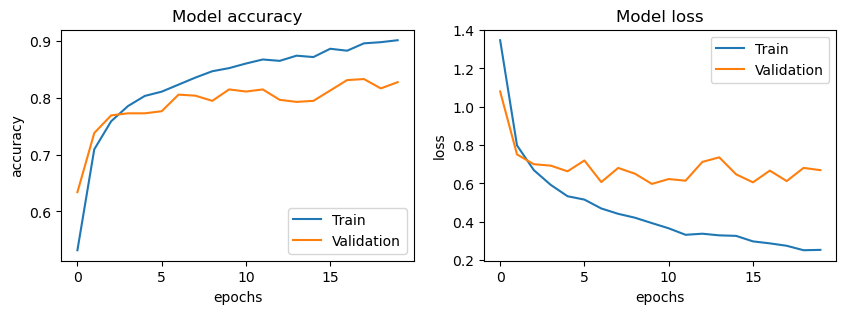

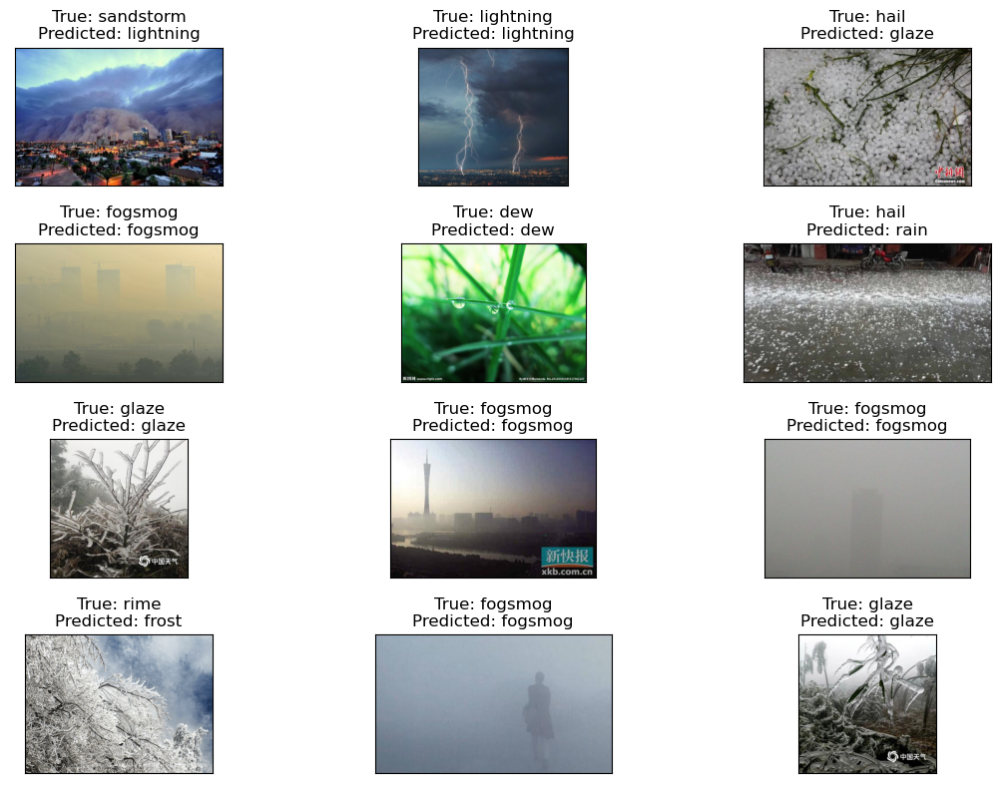

In [11]:
history_ENet=plot(history,train_gen_ENet,valid_gen_ENet,test_gen_ENet, ENet_model)

# Performance Evalution:

**Overall, we got an accuracy of 79%. As we are dealing with unbalnced classification we cannot rely on Accuracy alone**

**After processing the data using EfficientNet pre trained model. The results are quite promising with a better F1- score for the classes. However, I can see some varience for the Minority classes such as "Snow", " Frost" and "Glaze".**

# MobilNet

In [12]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,valid_df,test_df)
MobileNet_model, callback=func(MobileNet)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_MobileNet.classes), y=train_gen_MobileNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = MobileNet_model.fit(train_gen_MobileNet,validation_data=valid_gen_MobileNet,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
17225924/17225924 [==============================] - 0s 0us/step
Epoch 1/25
155/155 [==============================] - 36s 216ms/step - loss: 0.9275 - accuracy: 0.6800 - val_loss: 0.6591 - val_accuracy: 0.7942
Epoch 2/25
155/155 [==============================] - 33s 215ms/step - loss: 0.4278 - accuracy: 0.8468 - val_loss: 0.5114 - val_accuracy: 0.8470
Epoch 3/25
155/155 [==============================] - 33s 215ms/step - loss: 0.2772 - accuracy: 0.8992 - val_loss: 0.5297 - val_accuracy: 0.8488
Epoch 4/25
155/155 [==============================] - 34s 217ms/step - loss: 0.1757 - accuracy: 0.9391 - val_loss: 0.5545 - val_accuracy: 0.8324
Epoch 5/25
155/155 [==============================] - 33s 214ms/step - loss: 0.1150 - accuracy: 0.9617 - val_loss: 0.6126 - val_accuracy: 0.8270
Epoch 6/25
155/155 [=====

# MobilNet
**Similarly like EfficientNet, now we are using MobilNet pre trained model as a feature extracter for classification. This function constructs a neural network model using the "MobileNet" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 30s 191ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      1.00      1.00       506
     fogsmog       1.00      1.00      1.00       635
       frost       1.00      1.00      1.00       337
       glaze       1.00      1.00      1.00       446
        hail       1.00      1.00      1.00       415
   lightning       1.00      1.00      1.00       270
        rain       1.00      1.00      1.00       377
     rainbow       1.00      1.00      1.00       159
        rime       1.00      1.00      1.00       828
   sandstorm       1.00      1.00      1.00       520
        snow       1.00      1.00      1.00       447

    accuracy                           1.00      4940
   macro avg       1.00      1.00      1.00      4940
weighted avg       1.00      1.00      1.00      4940

18/18 [==============================] - 3s 170ms/step
Validation Classification Report
          

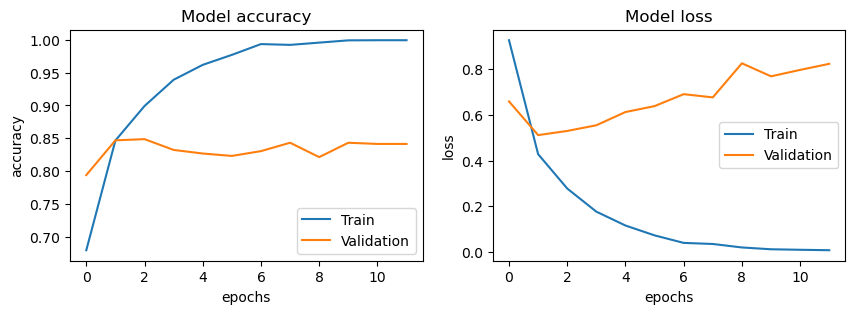

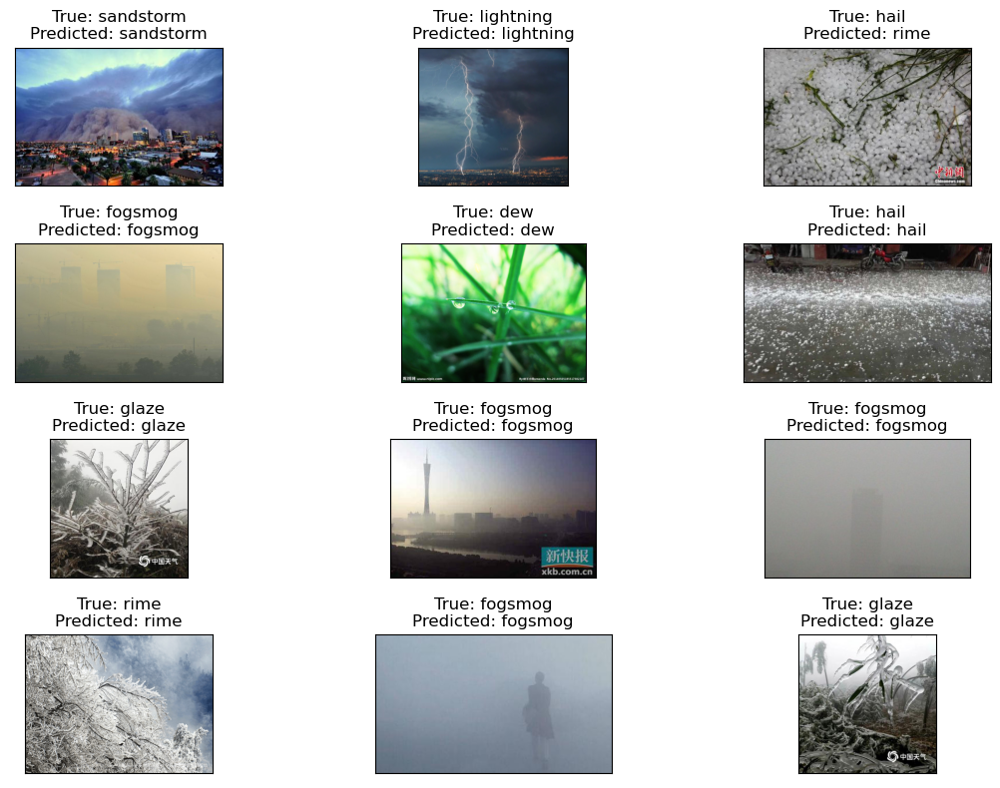

In [13]:
history_MobileNet = plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, MobileNet_model)

# Peformance Evaluation:
**Overall, the accuracy of the model is 83%**

**The F1-scores are raanging from 69% to 94% respectively. However, we can observe varience for some classes such as "Frost", Glaze and Snow"**

# ResNet

In [14]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

ResNet_pre=preprocess_input
train_gen_ResNet, valid_gen_ResNet, test_gen_ResNet = gen(ResNet_pre,train_df,valid_df,test_df)
ResNet_model, callback=func(ResNet50)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_ResNet.classes), y=train_gen_ResNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = ResNet_model.fit(train_gen_ResNet,validation_data=valid_gen_ResNet,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/25
155/155 [==============================] - 42s 240ms/step - loss: 0.7899 - accuracy: 0.7285 - val_loss: 0.5171 - val_accuracy: 0.8288
Epoch 2/25
155/155 [==============================] - 35s 223ms/step - loss: 0.3568 - accuracy: 0.8690 - val_loss: 0.5723 - val_accuracy: 0.8215
Epoch 3/25
155/155 [==============================] - 35s 223ms/step - loss: 0.2570 - accuracy: 0.8996 - val_loss: 0.4950 - val_accuracy: 0.8361
Epoch 4/25
155/155 [==============================] - 35s 223ms/step - loss: 0.1623 - accuracy: 0.9379 - val_loss: 0.4870 - val_accuracy: 0.8543
Epoch 5/25
155/155 [==============================] - 35s 224ms/step - loss: 0.1046 - accuracy: 0.9638 - val_loss: 0.5263 - val_accuracy: 0.8616
Epoch 6/25
155/155 [=====

# ResNet
**Similarly like previous models, now we are using ResNet pre trained model as a feature extracter for classification. This function constructs a neural network model using the "ResNet50" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 32s 199ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      1.00      1.00       506
     fogsmog       1.00      1.00      1.00       635
       frost       1.00      1.00      1.00       337
       glaze       1.00      1.00      1.00       446
        hail       1.00      1.00      1.00       415
   lightning       1.00      1.00      1.00       270
        rain       1.00      1.00      1.00       377
     rainbow       1.00      1.00      1.00       159
        rime       1.00      1.00      1.00       828
   sandstorm       1.00      1.00      1.00       520
        snow       1.00      1.00      1.00       447

    accuracy                           1.00      4940
   macro avg       1.00      1.00      1.00      4940
weighted avg       1.00      1.00      1.00      4940

18/18 [==============================] - 3s 182ms/step
Validation Classification Report
          

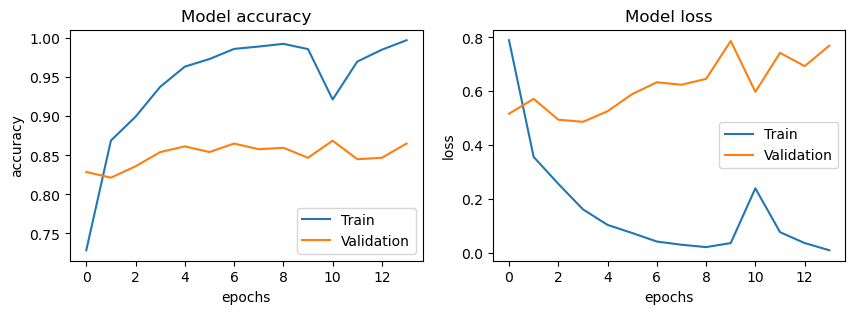

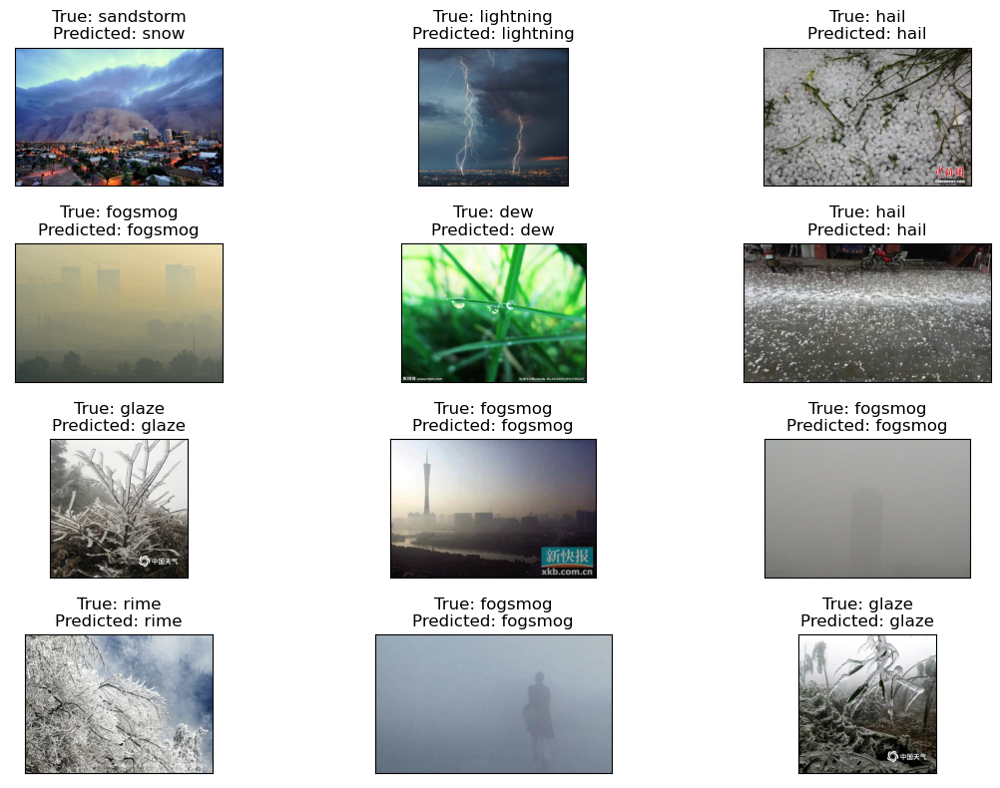

In [15]:
history_ResNet= plot(history,train_gen_ResNet,valid_gen_ResNet, test_gen_ResNet,ResNet_model)

# Performance Evaluation:
**Overall, the accuracy of the model satands at 84%**

**The F1-score for the ResNet Model is ranging from 69% to 97% respectively. However, comapred to previous ResNet model performed better. Moreover, we can observe varience for the same classes "Snow", "Glaze" and "Frost".**

# VGG 16

In [16]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

vgg_pre=preprocess_input
train_gen_VGG, valid_gen_VGG, test_gen_VGG = gen(vgg_pre,train_df,valid_df,test_df)
model_VGG16, callback=func(VGG16)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_VGG.classes), y=train_gen_VGG.classes)
train_class_weights = dict(enumerate(class_weights))

history = model_VGG16.fit(train_gen_VGG,validation_data=valid_gen_VGG,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/25
155/155 [==============================] - 38s 224ms/step - loss: 1.4003 - accuracy: 0.6107 - val_loss: 0.9213 - val_accuracy: 0.7031
Epoch 2/25
155/155 [==============================] - 34s 221ms/step - loss: 0.5426 - accuracy: 0.8077 - val_loss: 0.6979 - val_accuracy: 0.8106
Epoch 3/25
155/155 [==============================] - 34s 220ms/step - loss: 0.3357 - accuracy: 0.8781 - val_loss: 0.6917 - val_accuracy: 0.7887
Epoch 4/25
155/155 [==============================] - 36s 233ms/step - loss: 0.2271 - accuracy: 0.9152 - val_loss: 0.7410 - val_accuracy: 0.8087
Epoch 5/25
155/155 [==============================] - 34s 220ms/step - loss: 0.1633 - accuracy: 0.9423 - val_loss: 0.6767 - val_accuracy: 0.8215
Epoch 6/25
155/155 [=====

# VGG 16
**Similarly like previous models, now we are using VGG 16 pre trained model as a feature extracter for classification. This function constructs a neural network model using the "VGG16" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 31s 198ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      1.00      1.00       506
     fogsmog       1.00      1.00      1.00       635
       frost       1.00      1.00      1.00       337
       glaze       1.00      1.00      1.00       446
        hail       1.00      1.00      1.00       415
   lightning       1.00      1.00      1.00       270
        rain       1.00      1.00      1.00       377
     rainbow       1.00      1.00      1.00       159
        rime       1.00      1.00      1.00       828
   sandstorm       1.00      0.99      1.00       520
        snow       1.00      1.00      1.00       447

    accuracy                           1.00      4940
   macro avg       1.00      1.00      1.00      4940
weighted avg       1.00      1.00      1.00      4940

18/18 [==============================] - 3s 181ms/step
Validation Classification Report
          

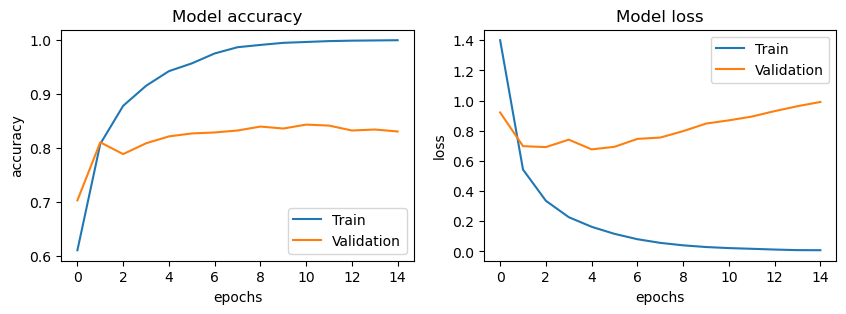

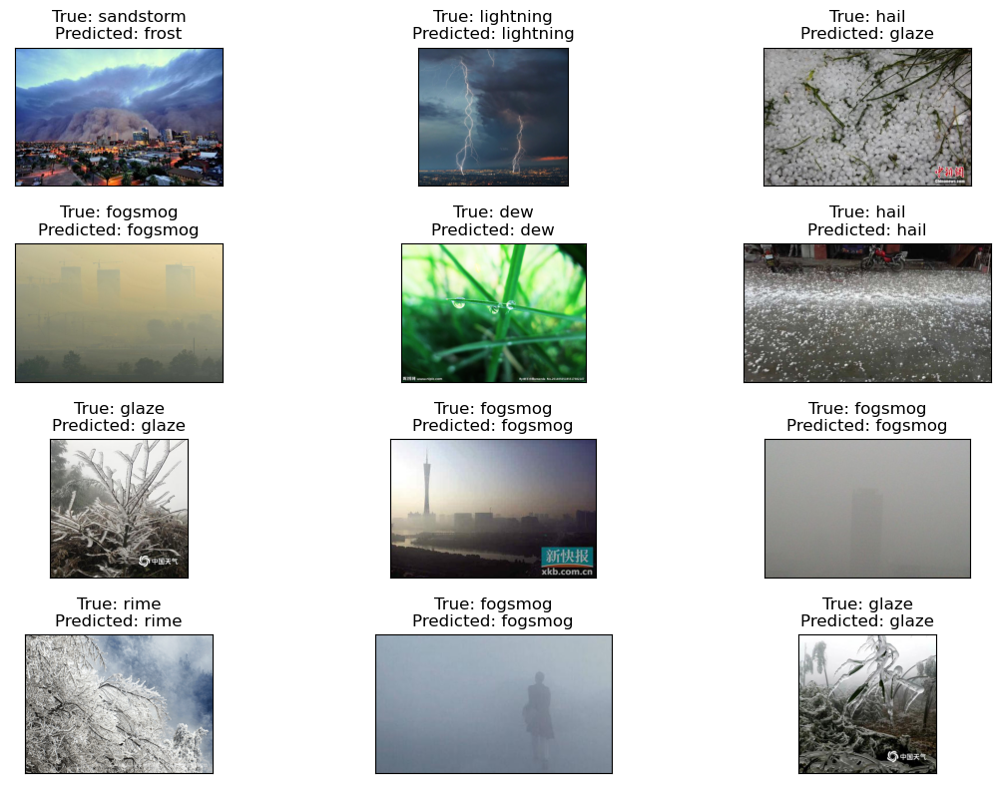

In [17]:
history=plot(history,train_gen_VGG,valid_gen_VGG,test_gen_VGG, model_VGG16)

# Performance Evaluation:
**Overall, the accuracy of the model satands at 81%**

**The F1-score for the VGG16 Model is ranging from 63% to 90% respectively. VGG16 performed ideally for the given data set. Moreover, we can observe varience for the same classes "Snow", "Glaze" and "Frost".**

# VGG 19

In [18]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
VGG19_pre=preprocess_input
train_gen_VGG19, valid_gen_VGG19, test_gen_VGG19 = gen(VGG19_pre,train_df,valid_df,test_df)
VGG19_model, callback=func(VGG19)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_VGG19.classes), y=train_gen_VGG19.classes)
train_class_weights = dict(enumerate(class_weights))

history = VGG19_model.fit(train_gen_VGG19,validation_data=valid_gen_VGG19,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
80134624/80134624 [==============================] - 0s 0us/step
Epoch 1/25
155/155 [==============================] - 36s 223ms/step - loss: 1.5000 - accuracy: 0.5864 - val_loss: 0.7504 - val_accuracy: 0.7741
Epoch 2/25
155/155 [==============================] - 35s 224ms/step - loss: 0.5346 - accuracy: 0.8162 - val_loss: 0.6254 - val_accuracy: 0.7978
Epoch 3/25
155/155 [==============================] - 35s 223ms/step - loss: 0.3309 - accuracy: 0.8777 - val_loss: 0.5882 - val_accuracy: 0.8106
Epoch 4/25
155/155 [==============================] - 35s 223ms/step - loss: 0.2247 - accuracy: 0.9180 - val_loss: 0.6203 - val_accuracy: 0.8233
Epoch 5/25
155/155 [==============================] - 35s 224ms/step - loss: 0.1537 - accuracy: 0.9445 - val_loss: 0.6096 - val_accuracy: 0.8270
Epoch 6/25
155/155 [=====

# VGG 19
**Similarly like previous models, now we are using VGG 19 pre trained model as a feature extracter for classification. This function constructs a neural network model using the "VGG19" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 31s 200ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       0.98      0.97      0.97       506
     fogsmog       0.99      0.94      0.97       635
       frost       0.90      0.98      0.94       337
       glaze       0.96      0.91      0.94       446
        hail       0.98      0.92      0.95       415
   lightning       1.00      0.98      0.99       270
        rain       0.99      0.90      0.94       377
     rainbow       0.96      0.99      0.98       159
        rime       0.96      0.97      0.96       828
   sandstorm       0.97      0.98      0.97       520
        snow       0.87      0.98      0.92       447

    accuracy                           0.96      4940
   macro avg       0.96      0.96      0.96      4940
weighted avg       0.96      0.96      0.96      4940

18/18 [==============================] - 3s 178ms/step
Validation Classification Report
          

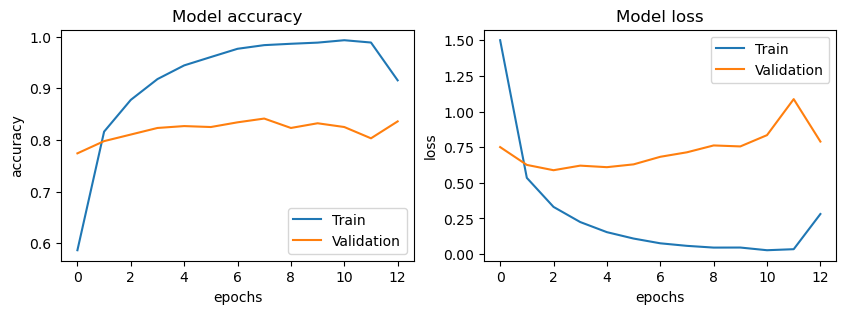

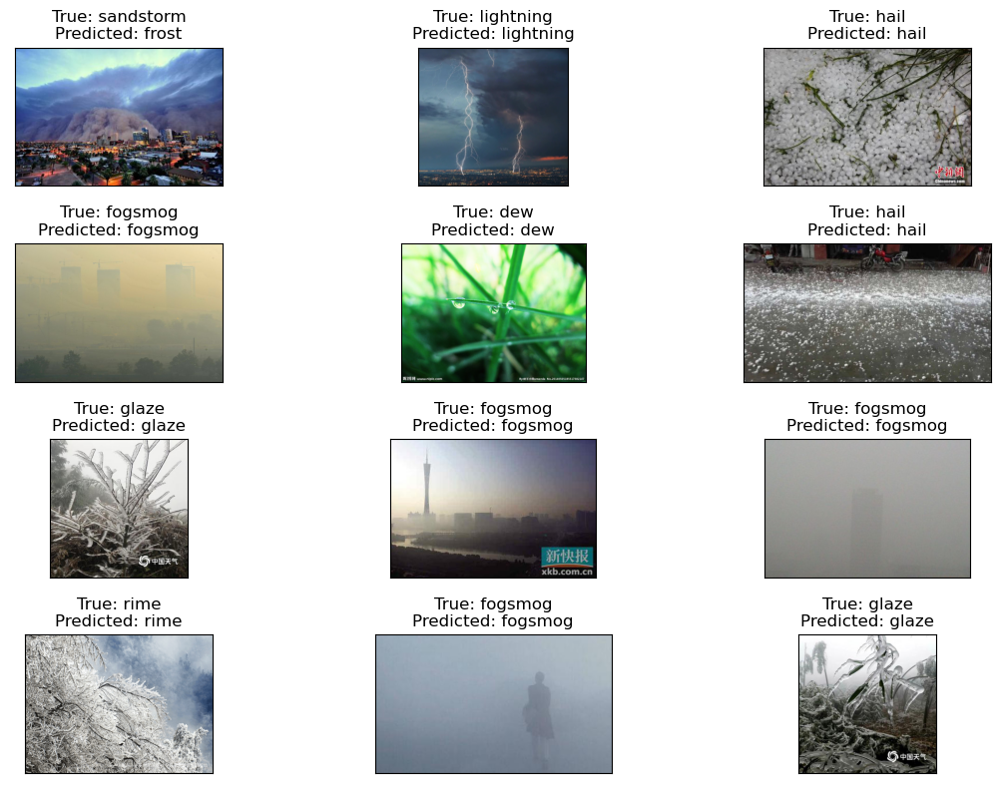

In [19]:
history_VGG19= plot(history,train_gen_VGG19,valid_gen_VGG19, test_gen_VGG19,VGG19_model)

# Performance Evaluation:
**Overall, the accuracy of the model satands at 79%**

**The F1-score for the VGG19 Model is ranging from 65% to 93% respectively. VGG19 performed ideally for the given data set. Moreover, we can observe varience for the same classes "Snow", "Glaze" and "Frost".**

# Xception

In [20]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input
Xception_pre=preprocess_input
train_gen_Xception, valid_gen_Xception, test_gen_Xception = gen(Xception_pre,train_df,valid_df,test_df)
Xception_model, callback=func(Xception)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_Xception.classes), y=train_gen_Xception.classes)
train_class_weights = dict(enumerate(class_weights))

history = Xception_model.fit(train_gen_Xception,validation_data=valid_gen_Xception,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
83683744/83683744 [==============================] - 1s 0us/step
Epoch 1/25
155/155 [==============================] - 40s 230ms/step - loss: 1.2676 - accuracy: 0.5848 - val_loss: 0.9346 - val_accuracy: 0.6958
Epoch 2/25
155/155 [==============================] - 35s 224ms/step - loss: 0.7047 - accuracy: 0.7526 - val_loss: 0.7961 - val_accuracy: 0.7596
Epoch 3/25
155/155 [==============================] - 35s 224ms/step - loss: 0.5155 - accuracy: 0.8146 - val_loss: 0.7564 - val_accuracy: 0.7505
Epoch 4/25
155/155 [==============================] - 35s 226ms/step - loss: 0.3850 - accuracy: 0.8690 - val_loss: 0.7570 - val_accuracy: 0.7650
Epoch 5/25
155/155 [==============================] - 35s 223ms/step - loss: 0.2885 - accuracy: 0.8955 - val_loss: 0.7412 - val_accuracy: 0.7778
Epoch 6/25
155/155 [=====

# Xception
**Similarly like previous models, now we are using Xception pre trained model as a feature extracter for classification. This function constructs a neural network model using the "Xception" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 31s 196ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      1.00      1.00       506
     fogsmog       1.00      1.00      1.00       635
       frost       1.00      1.00      1.00       337
       glaze       1.00      1.00      1.00       446
        hail       1.00      1.00      1.00       415
   lightning       1.00      1.00      1.00       270
        rain       1.00      1.00      1.00       377
     rainbow       1.00      1.00      1.00       159
        rime       1.00      1.00      1.00       828
   sandstorm       0.99      1.00      1.00       520
        snow       1.00      1.00      1.00       447

    accuracy                           1.00      4940
   macro avg       1.00      1.00      1.00      4940
weighted avg       1.00      1.00      1.00      4940

18/18 [==============================] - 3s 176ms/step
Validation Classification Report
          

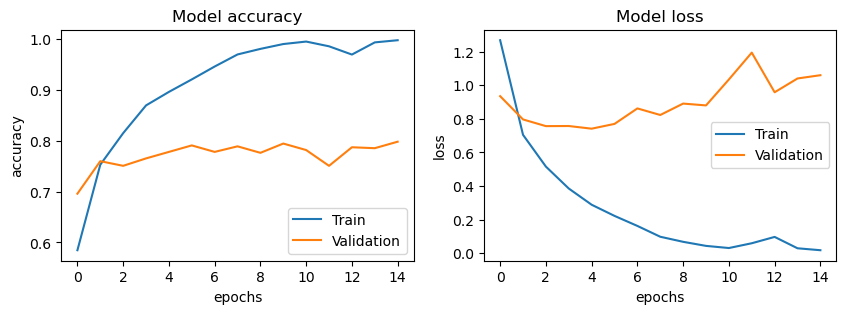

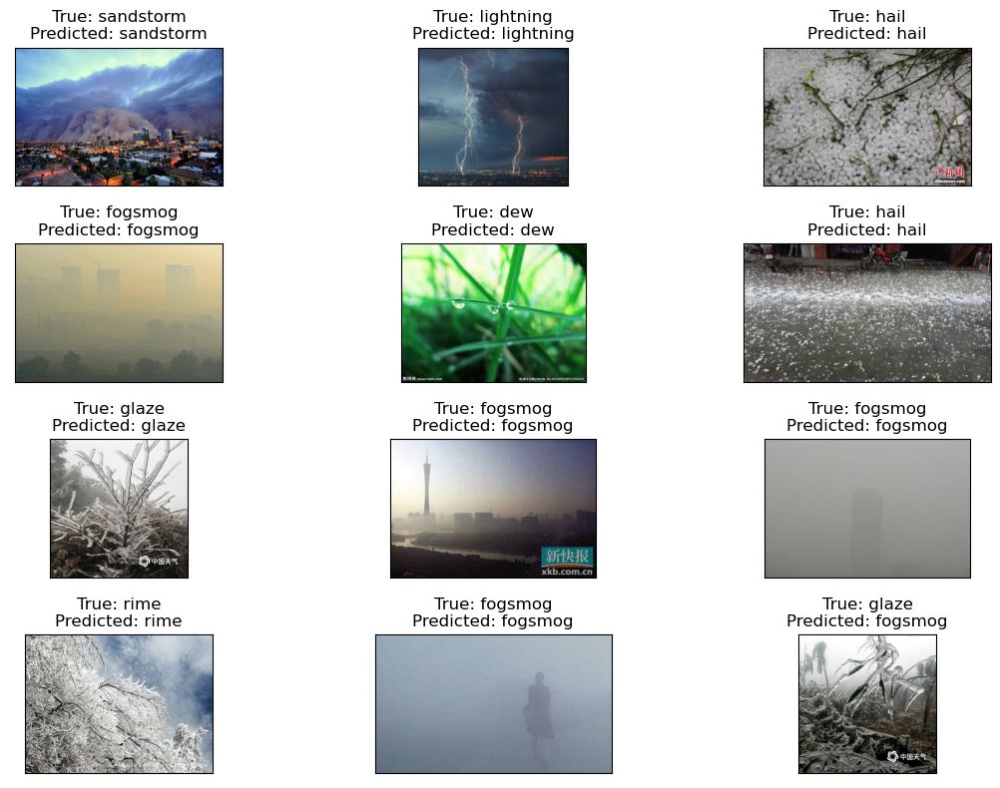

In [21]:
history_Xception = plot(history,train_gen_Xception,valid_gen_Xception,test_gen_Xception, Xception_model)

# Performance Evaluation:
**Overall, the accuracy of the model satands at 80%**

**The F1-score for the Xception Model is ranging from 60% to 96% respectively. Xception model performed ideally for the given data set. Moreover, we can observe varience for the same classes "Snow", "Glaze", "Rain" and "Frost".**

# DenseNet201

In [22]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

DenseNet201_pre=preprocess_input
train_gen_DenseNet201, valid_gen_DenseNet201, test_gen_DenseNet201 = gen(DenseNet201_pre,train_df,valid_df,test_df)
model_DenseNet201, callback=func(DenseNet201)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_DenseNet201.classes), y=train_gen_DenseNet201.classes)
train_class_weights = dict(enumerate(class_weights))

history = model_DenseNet201.fit(train_gen_DenseNet201,validation_data=valid_gen_DenseNet201,epochs=25,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
74836368/74836368 [==============================] - 1s 0us/step
Epoch 1/25
155/155 [==============================] - 55s 269ms/step - loss: 0.8833 - accuracy: 0.6986 - val_loss: 0.5693 - val_accuracy: 0.8251
Epoch 2/25
155/155 [==============================] - 38s 248ms/step - loss: 0.4196 - accuracy: 0.8427 - val_loss: 0.5067 - val_accuracy: 0.8434
Epoch 3/25
155/155 [==============================] - 36s 232ms/step - loss: 0.2750 - accuracy: 0.8988 - val_loss: 0.5312 - val_accuracy: 0.8434
Epoch 4/25
155/155 [==============================] - 36s 233ms/step - loss: 0.2006 - accuracy: 0.9239 - val_loss: 0.5151 - val_accuracy: 0.8488
Epoch 5/25
155/155 [==============================] - 37s 236ms/step - loss: 0.1430 - accuracy: 0.9415 - val_loss: 0.5606 - val_accuracy: 0.8434
Epoch 6/25
155/155 [=====

# DenseNet201
**Similarly like previous models, now we are using DenseNet201 pre trained model as a feature extracter for classification. This function constructs a neural network model using the "DenseNet201" pre-trained model as the feature extractor and adds additional layers for classification.**

155/155 [==============================] - 35s 205ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      0.99      0.99       506
     fogsmog       1.00      0.99      1.00       635
       frost       0.97      1.00      0.99       337
       glaze       1.00      0.96      0.98       446
        hail       0.94      1.00      0.97       415
   lightning       1.00      1.00      1.00       270
        rain       0.99      0.99      0.99       377
     rainbow       1.00      0.99      1.00       159
        rime       0.98      0.99      0.99       828
   sandstorm       1.00      1.00      1.00       520
        snow       1.00      0.96      0.98       447

    accuracy                           0.99      4940
   macro avg       0.99      0.99      0.99      4940
weighted avg       0.99      0.99      0.99      4940

18/18 [==============================] - 4s 192ms/step
Validation Classification Report
          

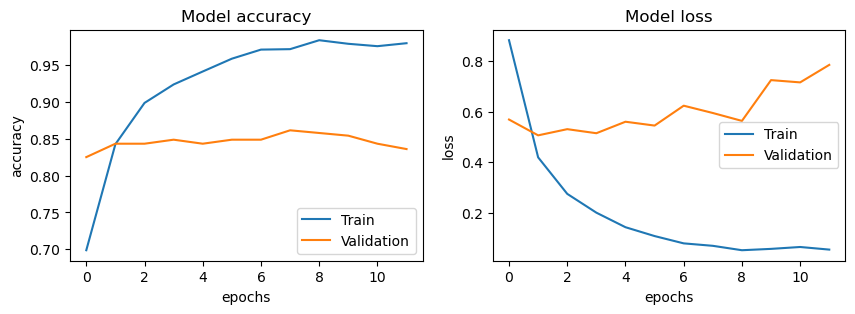

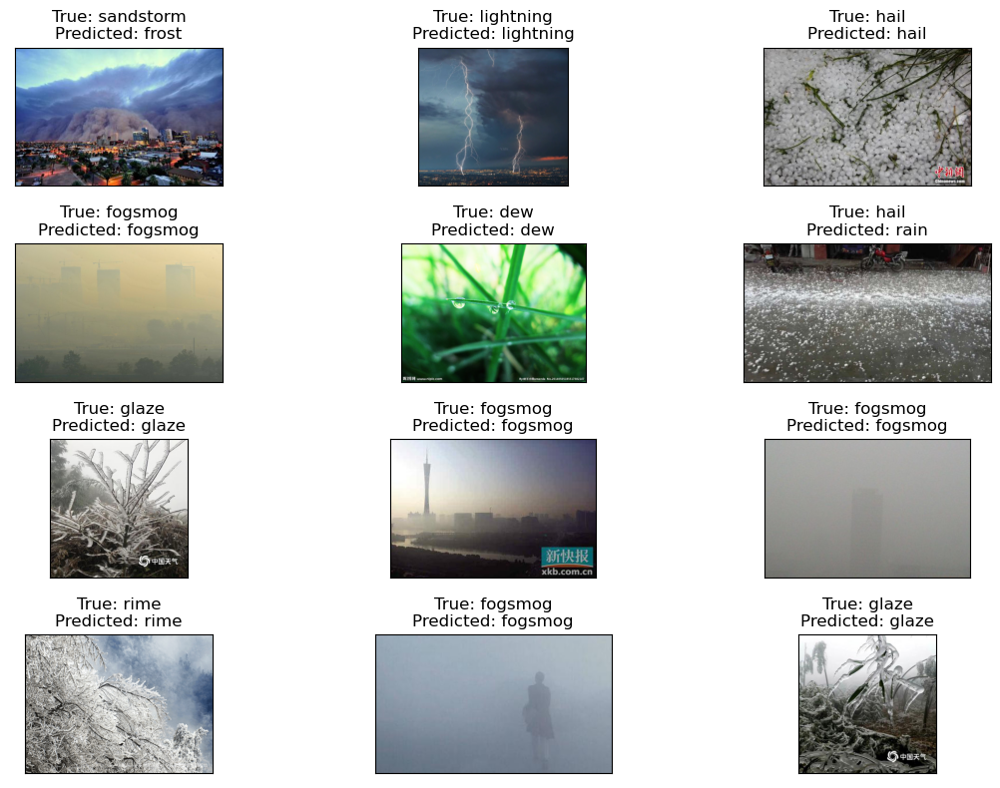

In [23]:
history=plot(history,train_gen_DenseNet201,valid_gen_DenseNet201,test_gen_DenseNet201, model_DenseNet201)

# Performance Evalution:

**Overall, we got an accuracy of 85%.**

**After processing the data using DenseNet201 pre trained model. The results are quite promising with a better F1- score for the classes. The F1- Scores ranged between 68% to 97%. However, I can see some varience for the Minority classes such as "Snow", " Frost" and "Glaze".**

**Of all the pretrined model DenseNet201 yeilded optimumn results than others.**

# Comparing all the Pretrained Models.

**After comparing the results of all the pretrained Models, DenseNet201 Model performed better than other pre trained Models.**

**There is one unique result among all the models i.e. particularly three classes "Snow", "Frost" and "Glaze" showed high varience between training and testing. This can be clearly seen in results that model is not able to identify these classes accurately**.

**Possible Reason**:

- As the poorley performed classes are Snow, Frost and Glaze are the weathers which almost looks similar. we suspect the features of these images are similar for the model to predict and while doing so the model is suffering form varience while predciting these weathers particularly**

# **Custom CNN Models**

**We have worked with Pretrained models. Now let us work with Custom CNN models with differnt parameters, penalties and let us check the perfoemances for different models.**

In [24]:
from keras.layers import Add, Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation

In [25]:
model_1 = Sequential()


## 5x5 convolution with 2x2 stride and 250 filters
model_1.add(Conv2D(250, (5, 5), strides = (2,2), padding='same',input_shape=(100,100,3)))
model_1.add(Activation('relu'))

## Another 5x5 convolution with 2x2 stride and 250 filters
model_1.add(Conv2D(250, (5, 5), strides = (2,2)))
model_1.add(Activation('relu'))

## 2x2 max pooling reduces to 3 x 3 x 250
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Dropout(0.25))

## Flatten turns 3x3x250 into 225000X1
model_1.add(Flatten())
model_1.add(Dense(512))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.5))
model_1.add(Dense(11))
model_1.add(Activation('softmax'))

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 50, 50, 250)       19000     
                                                                 
 activation (Activation)     (None, 50, 50, 250)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 23, 23, 250)       1562750   
                                                                 
 activation_1 (Activation)   (None, 23, 23, 250)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 11, 11, 250)      0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 11, 11, 250)       0         
                                                        

# Model_1

**We used Sequential to create a model by simply adding layers in sequential order**

**we used a 2D convolutional layer with 250 filters**

**Each filter size of 5x5, and a stride of 2x2.**

**The padding parameter is set to 'same', which means the spatial dimensions of the output feature maps will be the same as the input.**

**We used ReLU activation function after the convolutional layer to introduce non-linearity.**

**We used a Connected CNN with 512 units and later applied ReLu for Full connected model. Finally softmax is used to obtain class probabilities**

**Model_1 is a convolutional neural network with two convolutional layers followed by max pooling, dropout, and two fully connected layers. The model aims to classify input images into one of the 11 classes defined by the output layer.**

In [26]:
model_1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [27]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,valid_df,test_df)
MobileNet_model, callback=func(MobileNet)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_MobileNet.classes), y=train_gen_MobileNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = model_1.fit(train_gen_MobileNet,validation_data=valid_gen_MobileNet,epochs=100,callbacks=callback,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100


2023-05-01 17:44:17.112683: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


155/155 [==============================] - 44s 263ms/step - loss: 1.6935 - accuracy: 0.4478 - val_loss: 1.3208 - val_accuracy: 0.5483
Epoch 2/100
155/155 [==============================] - 35s 229ms/step - loss: 1.3220 - accuracy: 0.5632 - val_loss: 1.2783 - val_accuracy: 0.5665
Epoch 3/100
155/155 [==============================] - 36s 229ms/step - loss: 1.1767 - accuracy: 0.6123 - val_loss: 1.1380 - val_accuracy: 0.6430
Epoch 4/100
155/155 [==============================] - 36s 229ms/step - loss: 1.0319 - accuracy: 0.6492 - val_loss: 1.0565 - val_accuracy: 0.6557
Epoch 5/100
155/155 [==============================] - 36s 229ms/step - loss: 0.9257 - accuracy: 0.6874 - val_loss: 1.0288 - val_accuracy: 0.6630
Epoch 6/100
155/155 [==============================] - 35s 228ms/step - loss: 0.8200 - accuracy: 0.7148 - val_loss: 1.0748 - val_accuracy: 0.6703
Epoch 7/100
155/155 [==============================] - 36s 231ms/step - loss: 0.7807 - accuracy: 0.7287 - val_loss: 1.0407 - val_accurac

155/155 [==============================] - 30s 193ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      0.99      0.99       506
     fogsmog       0.95      0.95      0.95       635
       frost       1.00      0.99      1.00       337
       glaze       0.97      0.99      0.98       446
        hail       1.00      0.98      0.99       415
   lightning       0.96      1.00      0.98       270
        rain       1.00      0.98      0.99       377
     rainbow       0.99      0.87      0.93       159
        rime       0.93      0.99      0.96       828
   sandstorm       0.98      0.93      0.95       520
        snow       0.97      0.98      0.97       447

    accuracy                           0.97      4940
   macro avg       0.98      0.97      0.97      4940
weighted avg       0.97      0.97      0.97      4940

18/18 [==============================] - 3s 169ms/step
Validation Classification Report
          

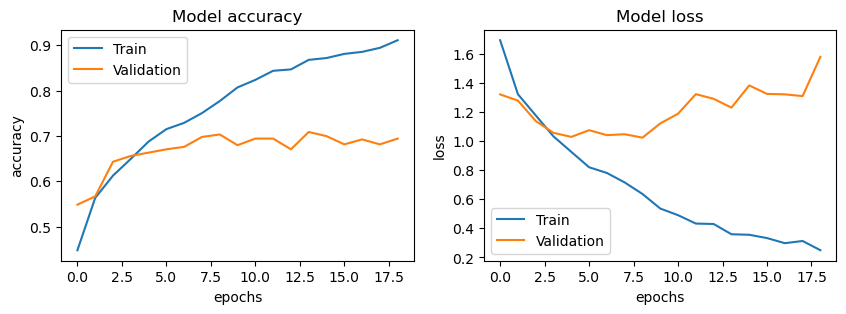

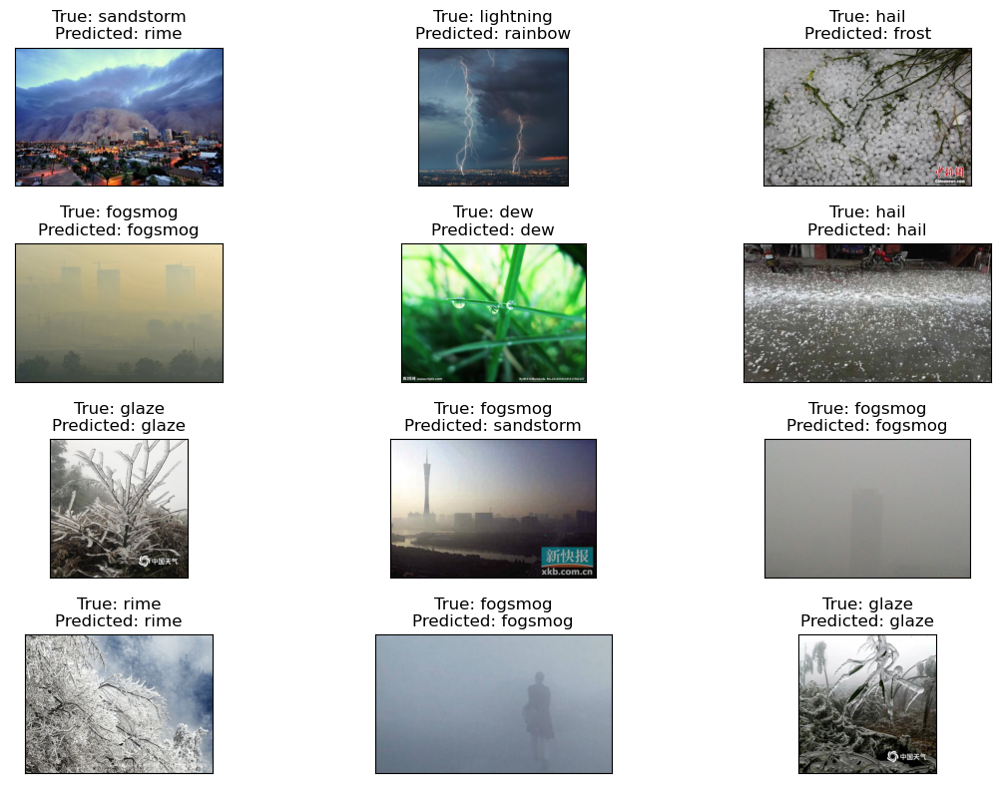

In [28]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, model_1)

# Performance Evaluation:

**The overall accuracy of the custom model 1 stands at 71%**

**When compared to pretrained models custom model did not perform very better. The F1-scores are ranging between 48% to 54% respectively.**

# Custom 2

In [40]:
model_1 = Sequential()


model_1.add(Conv2D(1024, (5, 5), strides = (2,2), padding='same',input_shape=(100,100,3)))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Activation('relu'))

model_1.add(Conv2D(512, (5, 5), strides = (2,2), padding='same'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Activation('relu'))

model_1.add(Conv2D(256, (5, 5), strides = (2,2), padding='same'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Activation('relu'))

model_1.add(Conv2D(128, (5, 5), strides = (2,2), padding='same'))
model_1.add(Activation('relu'))

## 2x2 max pooling reduces to 3 x 3 x 250
model_1.add(Dropout(0.25))

## Flatten turns 3x3x250 into 225000X1
model_1.add(Flatten())
model_1.add(Dense(512))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.5))
model_1.add(Dense(256))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.5))
model_1.add(Dense(128))
model_1.add(Activation('relu'))
model_1.add(Dense(11))
model_1.add(Activation('softmax'))

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 50, 50, 1024)      77824     
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 25, 25, 1024)     0         
 g2D)                                                            
                                                                 
 activation (Activation)     (None, 25, 25, 1024)      0         
                                                                 
 conv2d_25 (Conv2D)          (None, 13, 13, 512)       13107712  
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 6, 6, 512)        0         
 g2D)                                                            
                                                                 
 activation_1 (Activation)   (None, 6, 6, 512)         0

# Custom Model 2
**The architecture of this model is different from the previous model. Model 2 has a deeper architecture with more convolutional layers and additional dense layers. It consists of four convolutional layers with decreasing numbers of filters (1024, 512, 256, 128), followed by max pooling and ReLU activation. After flattening the feature maps, it includes three dense layers with decreasing numbers of units (512, 256, 128) and ReLU activation. Finally, there is an output layer with 11 units and softmax activation for multi-class classification.**

In [41]:
model_1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [42]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,valid_df,test_df)
MobileNet_model, callback=func(MobileNet)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_MobileNet.classes), y=train_gen_MobileNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = model_1.fit(train_gen_MobileNet,validation_data=valid_gen_MobileNet,epochs=20,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/20


2023-05-05 18:31:00.096682: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout_14/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


155/155 [==============================] - 40s 233ms/step - loss: 2.2974 - accuracy: 0.1490 - val_loss: 2.0207 - val_accuracy: 0.2805
Epoch 2/20
155/155 [==============================] - 35s 226ms/step - loss: 1.8689 - accuracy: 0.3063 - val_loss: 1.7063 - val_accuracy: 0.3588
Epoch 3/20
155/155 [==============================] - 35s 228ms/step - loss: 1.6684 - accuracy: 0.3773 - val_loss: 1.4762 - val_accuracy: 0.4791
Epoch 4/20
155/155 [==============================] - 37s 237ms/step - loss: 1.5833 - accuracy: 0.4097 - val_loss: 1.4302 - val_accuracy: 0.4754
Epoch 5/20
155/155 [==============================] - 35s 226ms/step - loss: 1.5123 - accuracy: 0.4532 - val_loss: 1.4022 - val_accuracy: 0.4845
Epoch 6/20
155/155 [==============================] - 35s 225ms/step - loss: 1.4216 - accuracy: 0.4794 - val_loss: 1.2547 - val_accuracy: 0.5628
Epoch 7/20
155/155 [==============================] - 35s 224ms/step - loss: 1.3565 - accuracy: 0.5281 - val_loss: 1.2851 - val_accuracy: 0.5

155/155 [==============================] - 29s 186ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       0.93      0.85      0.89       509
     fogsmog       0.86      0.90      0.88       619
       frost       0.54      0.81      0.65       332
       glaze       0.59      0.56      0.57       465
        hail       0.76      0.82      0.79       436
   lightning       0.80      0.99      0.89       254
        rain       0.95      0.77      0.85       385
     rainbow       0.87      0.86      0.87       164
        rime       0.90      0.85      0.87       835
   sandstorm       0.89      0.81      0.85       489
        snow       0.88      0.77      0.82       452

    accuracy                           0.81      4940
   macro avg       0.82      0.82      0.81      4940
weighted avg       0.83      0.81      0.82      4940

18/18 [==============================] - 3s 184ms/step
Validation Classification Report
          

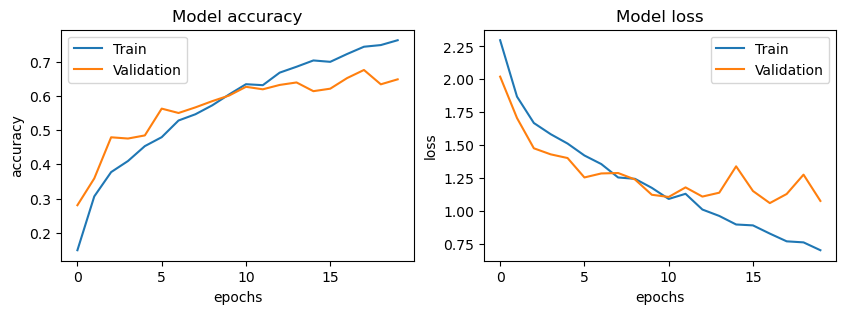

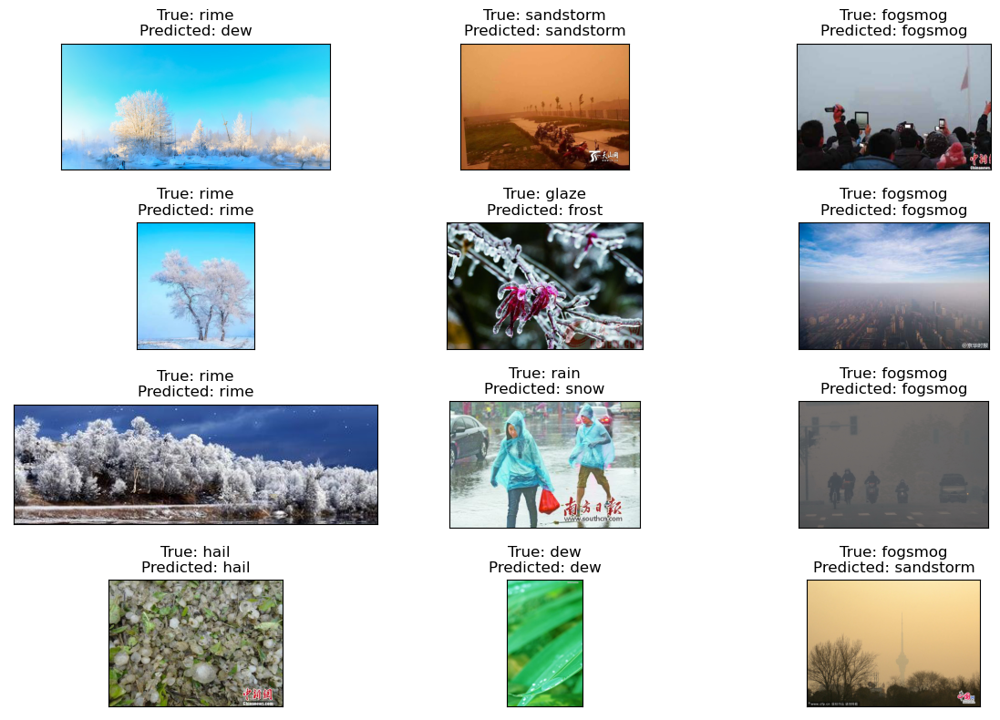

In [43]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, model_1)

# Performance Evaluation:

**The overall accuracy of the model 2 stands at 66%**

**Despite using more convolutional layers and dense layer the F1-score of this model remained almost similar to the previous model. In this model we are surprised by the F1-scores of Rain and Rainbow. We suppose the number of sample data for these classes must be increased based on the support metric**

In [44]:
input_layer = keras.layers.Input(shape=(100,100,3))
#CNN - Convolutional Layers
conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(input_layer)
conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(pooling_layer)
conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

#FC - Fully connected
flatten = keras.layers.Flatten()(pooling_layer)
dense = keras.layers.Dense(200, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(100, activation="relu")(dropout)
dropout = keras.layers.Dropout(0.2)(dense)

classifier = keras.layers.Dense(11, activation="softmax")(dropout)

model2 = keras.Model(inputs=input_layer, outputs=classifier)
opt = keras.optimizers.Adam(learning_rate=0.001)
model2.compile(optimizer=opt, loss="categorical_crossentropy",metrics=['accuracy'])
model2.summary()
     

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 100, 100, 3)]     0         
                                                                 
 conv2d_28 (Conv2D)          (None, 100, 100, 32)      896       
                                                                 
 conv2d_29 (Conv2D)          (None, 100, 100, 32)      9248      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 50, 50, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 50, 50, 64)        18496     
                                                                 
 conv2d_31 (Conv2D)          (None, 50, 50, 64)        36928     
                                                          

# Custom Model 3
**Comparing this model to the previous model, this model has similar architecture with convolutional layers followed by pooling layers and fully connected layers. However, there are some differences in terms of the number of layers, filters, and units.**

In [45]:
model2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [46]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,valid_df,test_df)
MobileNet_model, callback=func(MobileNet)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_MobileNet.classes), y=train_gen_MobileNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = model2.fit(train_gen_MobileNet,validation_data=valid_gen_MobileNet,epochs=25,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/25
155/155 [==============================] - 35s 208ms/step - loss: 1.8379 - accuracy: 0.3919 - val_loss: 1.3471 - val_accuracy: 0.5665
Epoch 2/25
155/155 [==============================] - 32s 208ms/step - loss: 1.3680 - accuracy: 0.5415 - val_loss: 1.1527 - val_accuracy: 0.6466
Epoch 3/25
155/155 [==============================] - 32s 206ms/step - loss: 1.2035 - accuracy: 0.6095 - val_loss: 1.0174 - val_accuracy: 0.6339
Epoch 4/25
155/155 [==============================] - 32s 208ms/step - loss: 1.0674 - accuracy: 0.6358 - val_loss: 0.9770 - val_accuracy: 0.6794
Epoch 5/25
155/155 [==============================] - 32s 209ms/step - loss: 0.9243 - accuracy: 0.6816 - val_loss: 0.9670 - val_accuracy: 0.6976
Epoch 6/25
155/155 [==============================] - 32s 207ms/step - loss: 0.7859 - accu

155/155 [==============================] - 28s 182ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      1.00      1.00       509
     fogsmog       1.00      0.98      0.99       619
       frost       1.00      1.00      1.00       332
       glaze       1.00      1.00      1.00       465
        hail       1.00      1.00      1.00       436
   lightning       0.99      1.00      1.00       254
        rain       1.00      1.00      1.00       385
     rainbow       0.98      1.00      0.99       164
        rime       1.00      1.00      1.00       835
   sandstorm       0.98      1.00      0.99       489
        snow       1.00      1.00      1.00       452

    accuracy                           1.00      4940
   macro avg       1.00      1.00      1.00      4940
weighted avg       1.00      1.00      1.00      4940

18/18 [==============================] - 3s 172ms/step
Validation Classification Report
          

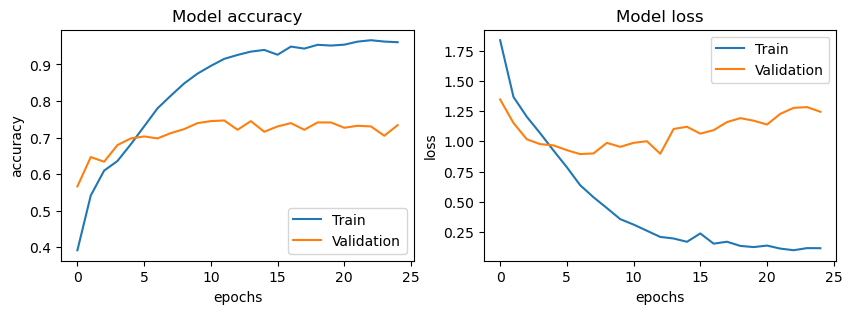

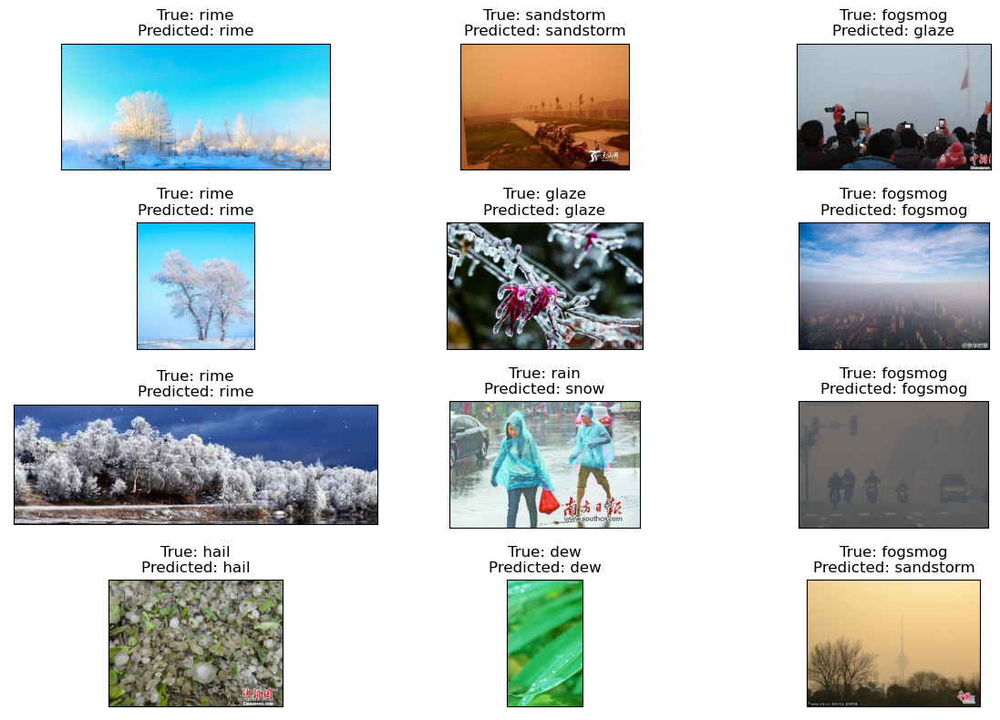

In [47]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, model2)

# Performance Evaluation:

**The overall accuracy stands at 72%**

**The F1-scores are ranging between 57% to 87%. This model performed better than the last one slight change in the parameters.**

In [48]:
input_layer = keras.layers.Input(shape=(100,100,3))
#CNN - Convolutional Layers
conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(input_layer)
conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

#CNN - Convolutional Layers
conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(input_layer)
conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

conv_layer = keras.layers.Conv2D(128, (3,3), activation="relu", padding="same")(pooling_layer)
conv_layer = keras.layers.Conv2D(128, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

#FC - Fully connected
flatten = keras.layers.Flatten()(pooling_layer)
dense = keras.layers.Dense(512, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(256, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(128, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(64, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(32, activation="relu")(dropout)
dropout = keras.layers.Dropout(0.2)(dense)

classifier = keras.layers.Dense(11, activation="softmax")(dropout)

model3= keras.Model(inputs=input_layer, outputs=classifier)
opt = keras.optimizers.Adam(learning_rate=0.001)
model3.compile(optimizer=opt, loss="categorical_crossentropy",metrics=['accuracy'])
model3.summary()
     

Model: "model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 100, 100, 3)]     0         
                                                                 
 conv2d_34 (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv2d_35 (Conv2D)          (None, 100, 100, 64)      36928     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 50, 50, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_36 (Conv2D)          (None, 50, 50, 128)       73856     
                                                                 
 conv2d_37 (Conv2D)          (None, 50, 50, 128)       147584    
                                                          

# Custom Model 4
**This model has a deeper architecture with more convolutional layers and additional dense layers. We have used dropout layers to regularize the model to avoid overfitting. We also increased depth and complexity of themodel The increased depth and complexity of the model to identify features in the data. Training this model took a lot of time time to process.**


In [49]:
model3.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [50]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,valid_df,test_df)
MobileNet_model, callback=func(MobileNet)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_MobileNet.classes), y=train_gen_MobileNet.classes)
train_class_weights = dict(enumerate(class_weights))

history = model3.fit(train_gen_MobileNet,validation_data=valid_gen_MobileNet,epochs=20,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/20
155/155 [==============================] - 35s 213ms/step - loss: 2.2755 - accuracy: 0.1644 - val_loss: 2.1281 - val_accuracy: 0.2058
Epoch 2/20
155/155 [==============================] - 33s 210ms/step - loss: 2.0752 - accuracy: 0.2423 - val_loss: 1.8080 - val_accuracy: 0.3115
Epoch 3/20
155/155 [==============================] - 32s 210ms/step - loss: 1.8580 - accuracy: 0.2787 - val_loss: 1.6816 - val_accuracy: 0.4390
Epoch 4/20
155/155 [==============================] - 33s 211ms/step - loss: 1.7803 - accuracy: 0.3194 - val_loss: 1.5805 - val_accuracy: 0.4044
Epoch 5/20
155/155 [==============================] - 33s 211ms/step - loss: 1.6435 - accuracy: 0.3656 - val_loss: 1.4916 - val_accuracy: 0.4882
Epoch 6/20
155/155 [==============================] - 33s 210ms/step - loss: 1.5967 - accu

155/155 [==============================] - 29s 184ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      0.92      0.96       509
     fogsmog       0.84      0.95      0.89       619
       frost       0.89      0.68      0.77       332
       glaze       0.76      0.91      0.83       465
        hail       0.95      0.92      0.93       436
   lightning       0.99      0.99      0.99       254
        rain       0.89      0.92      0.91       385
     rainbow       0.85      0.96      0.90       164
        rime       0.89      0.98      0.93       835
   sandstorm       0.98      0.77      0.86       489
        snow       0.95      0.85      0.90       452

    accuracy                           0.90      4940
   macro avg       0.91      0.90      0.90      4940
weighted avg       0.91      0.90      0.90      4940

18/18 [==============================] - 3s 180ms/step
Validation Classification Report
          

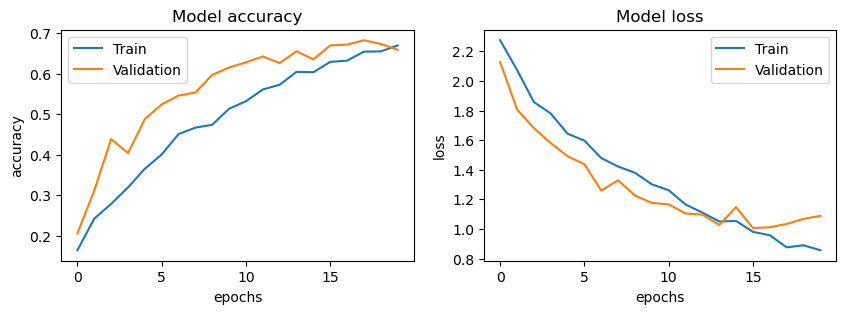

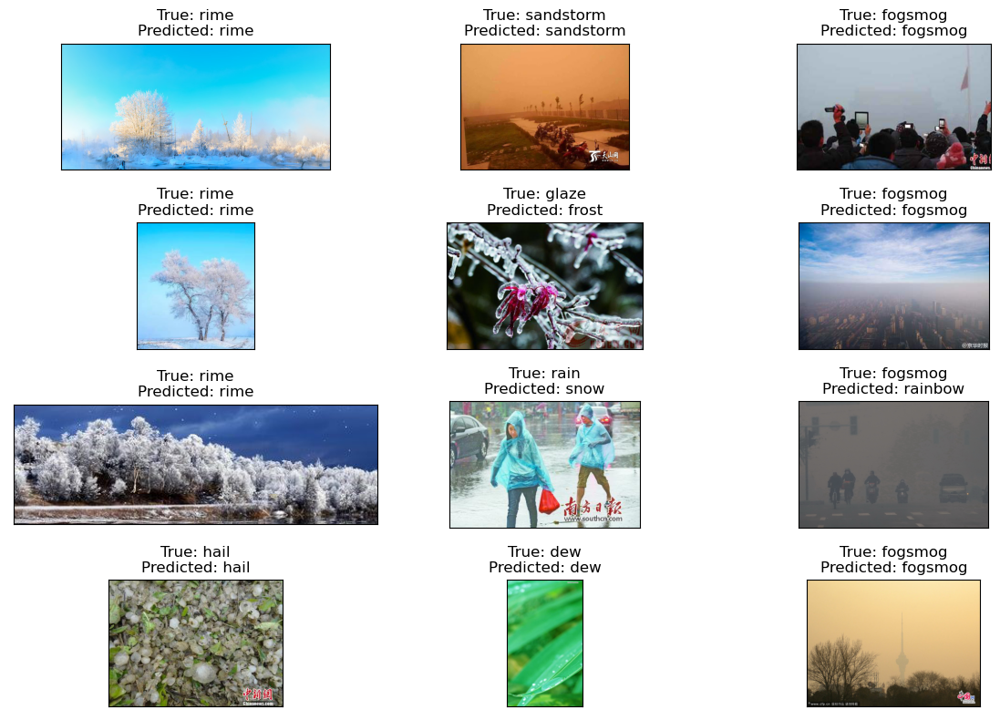

In [51]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, model3)

# Performance Evalutaion:

**The overall accuracy for this model stands at 67%**

**Despite using deeper architecture the F1-scores of the classes remained same ranging betwwen 47% to 88%**

In [52]:
input_layer = keras.layers.Input(shape=(100,100,3))
#CNN - Convolutional Layers
conv_layer = keras.layers.Conv2D(512, (3,3), activation="relu", padding="same")(input_layer)
conv_layer = keras.layers.Conv2D(512, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

#CNN - Convolutional Layers
conv_layer = keras.layers.Conv2D(256, (3,3), activation="relu", padding="same")(input_layer)
conv_layer = keras.layers.Conv2D(256, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

conv_layer = keras.layers.Conv2D(128, (3,3), activation="relu", padding="same")(pooling_layer)
conv_layer = keras.layers.Conv2D(128, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(pooling_layer)
conv_layer = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(pooling_layer)
conv_layer = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(conv_layer)
pooling_layer = keras.layers.MaxPool2D(pool_size=(2,2))(conv_layer)

#FC - Fully connected
flatten = keras.layers.Flatten()(pooling_layer)
dense = keras.layers.Dense(512, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(256, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(128, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(64, activation="relu")(flatten)
dropout = keras.layers.Dropout(0.5)(dense)
dense = keras.layers.Dense(32, activation="relu")(dropout)
dropout = keras.layers.Dropout(0.2)(dense)

classifier = keras.layers.Dense(11, activation="softmax")(dropout)

model4= keras.Model(inputs=input_layer, outputs=classifier)
opt = keras.optimizers.Adam(learning_rate=0.1)
model4.compile(optimizer=opt, loss="categorical_crossentropy",metrics=['accuracy'])
model4.summary()
     

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 100, 100, 3)]     0         
                                                                 
 conv2d_40 (Conv2D)          (None, 100, 100, 256)     7168      
                                                                 
 conv2d_41 (Conv2D)          (None, 100, 100, 256)     590080    
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 50, 50, 256)      0         
 g2D)                                                            
                                                                 
 conv2d_42 (Conv2D)          (None, 50, 50, 128)       295040    
                                                                 
 conv2d_43 (Conv2D)          (None, 50, 50, 128)       147584    
                                                          

# Custom Model 5
**we used five convolutional layers and this model has a larger number of filters in the convolutional layers, potentially allowing it to capture more complex features in the data. It also includes more convolutional and dense layers, providing a deeper and more complex architecture. However, we set learning rate as 0.1 which might not give us optimum values.**

In [53]:
model4.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [54]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

DenseNet201_pre=preprocess_input
train_gen_DenseNet201, valid_gen_DenseNet201, test_gen_DenseNet201 = gen(DenseNet201_pre,train_df,valid_df,test_df)
model_DenseNet201, callback=func(DenseNet201)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_DenseNet201.classes), y=train_gen_DenseNet201.classes)
train_class_weights = dict(enumerate(class_weights))

history = model4.fit(train_gen_DenseNet201,validation_data=valid_gen_DenseNet201,epochs=25,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/25
155/155 [==============================] - 39s 228ms/step - loss: 2.2941 - accuracy: 0.1804 - val_loss: 2.1482 - val_accuracy: 0.3424
Epoch 2/25
155/155 [==============================] - 36s 231ms/step - loss: 2.0221 - accuracy: 0.3045 - val_loss: 1.7663 - val_accuracy: 0.4098
Epoch 3/25
155/155 [==============================] - 35s 228ms/step - loss: 1.8589 - accuracy: 0.3407 - val_loss: 1.5701 - val_accuracy: 0.4736
Epoch 4/25
155/155 [==============================] - 35s 228ms/step - loss: 1.6801 - accuracy: 0.4113 - val_loss: 1.4524 - val_accuracy: 0.5209
Epoch 5/25
155/155 [==============================] - 35s 227ms/step - loss: 1.5960 - accuracy: 0.4421 - val_loss: 1.3503 - val_accuracy: 0.5355
Epoch 6/25
155/155 [==============================] - 35s 228ms/step - loss: 1.4638 - accu

155/155 [==============================] - 29s 188ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       0.77      0.85      0.80       509
     fogsmog       0.34      0.42      0.37       619
       frost       0.56      0.55      0.55       332
       glaze       0.70      0.28      0.40       465
        hail       0.90      0.41      0.57       436
   lightning       0.61      0.74      0.67       254
        rain       0.33      0.57      0.42       385
     rainbow       0.41      0.77      0.53       164
        rime       0.84      0.32      0.47       835
   sandstorm       0.39      0.98      0.55       489
        snow       0.88      0.12      0.21       452

    accuracy                           0.51      4940
   macro avg       0.61      0.55      0.50      4940
weighted avg       0.64      0.51      0.49      4940

18/18 [==============================] - 3s 184ms/step
Validation Classification Report
          

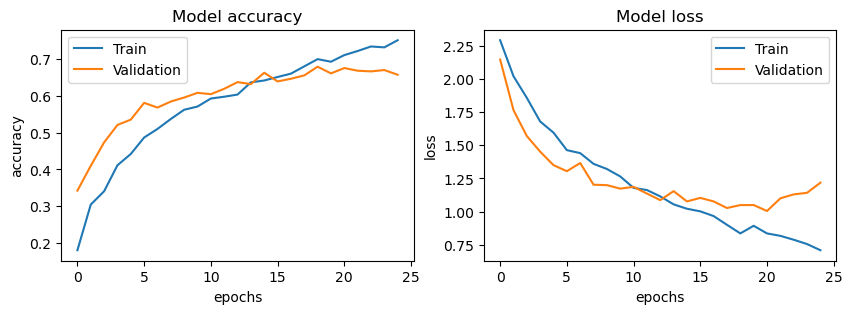

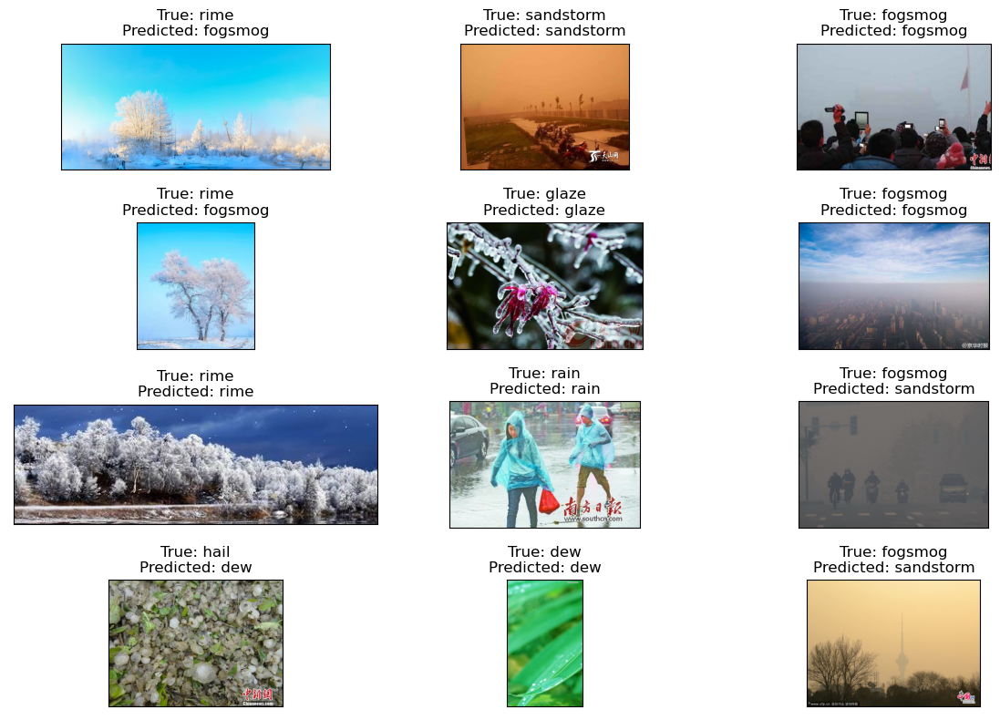

In [55]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, model4)

# Performance Evaluation:
**The overall accuracy satnds at 42%**

**As expected the performance of this model is very low as we set the learning rate to 0.1. The F1-scores of this model is ranging between 13% to 77% which is very poor classification.**


# Comparing Different custom Models

**Of all the above custom CNN models. Model 3 performed better than all other models. We have used 4 convolutional layers with decreasing filters after every stage in this model. Moreover, We used max pooling to identify the features**

# Regualarization
**For the custom model 4 we have used dropout regularization to avoid overfititng the data. However, this didnot work out very well and the performance was not very well desired.**


In [56]:
import tensorflow as tf

**Average Ensemble**

In [57]:
#Initiating the usage of individual models

models = [model2, model3, model4] #stacking individual models in a list
model_input = tf.keras.Input(shape=(100, 100, 3)) #takes a list of tensors as input, all of the same shape
model_outputs = [model(model_input) for model in models] #collects outputs of models in a list
ensemble_output = tf.keras.layers.Average()(model_outputs) #averaging outputs
ensemble_model = tf.keras.Model(inputs=model_input, outputs=ensemble_output)
ensemble_model.summary()

**In the ensembling we used multiple individual models into an ensemble model by averaging their outputs. The ensemble model takes an input image and produces an output that represents the average prediction of the individual models. This approach can potentially improve the overall performance and robustness of the model.**

***Ensemble 3 Models Trained***

In [58]:
ensemble_model.summary()

Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 100, 100, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_14 (Functional)          (None, 11)           8086979     ['input_21[0][0]']               
                                                                                                  
 model_16 (Functional)          (None, 11)           5382667     ['input_21[0][0]']               
                                                                                                  
 model_18 (Functional)          (None, 11)           1254539     ['input_21[0][0]']        

In [59]:
ensemble_model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [60]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

DenseNet201_pre=preprocess_input
train_gen_DenseNet201, valid_gen_DenseNet201, test_gen_DenseNet201 = gen(DenseNet201_pre,train_df,valid_df,test_df)
model_DenseNet201, callback=func(DenseNet201)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_DenseNet201.classes), y=train_gen_DenseNet201.classes)
train_class_weights = dict(enumerate(class_weights))

history = ensemble_model.fit(train_gen_DenseNet201,validation_data=valid_gen_DenseNet201,epochs=1,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
155/155 [==============================] - 45s 239ms/step - loss: 0.3629 - accuracy: 0.9356 - val_loss: 1.0083 - val_accuracy: 0.7395


155/155 [==============================] - 30s 194ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       1.00      0.93      0.96       509
     fogsmog       0.70      0.49      0.58       619
       frost       0.98      0.94      0.96       332
       glaze       1.00      0.93      0.96       465
        hail       0.98      0.88      0.92       436
   lightning       1.00      0.89      0.94       254
        rain       0.93      0.83      0.88       385
     rainbow       0.96      0.84      0.90       164
        rime       0.99      0.87      0.93       835
   sandstorm       0.45      0.99      0.62       489
        snow       0.99      0.86      0.92       452

    accuracy                           0.85      4940
   macro avg       0.91      0.86      0.87      4940
weighted avg       0.90      0.85      0.86      4940

18/18 [==============================] - 3s 182ms/step
Validation Classification Report
          

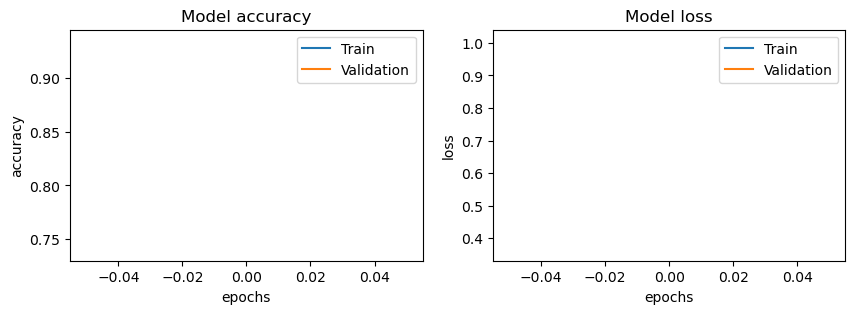

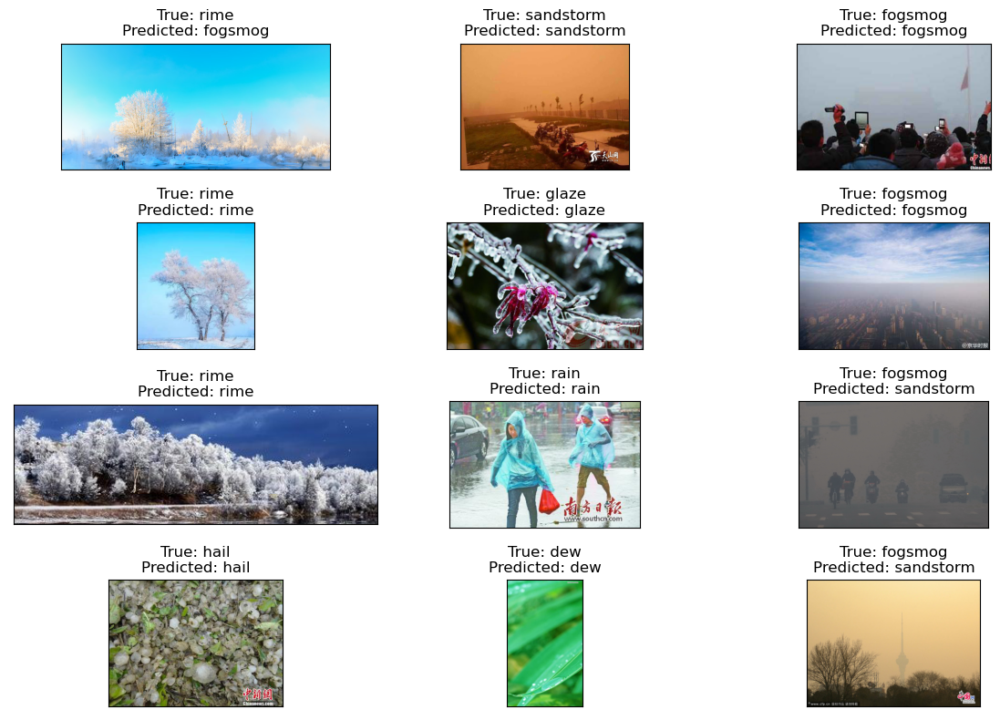

In [62]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, ensemble_model)

# Performance Evaluation:

**The ensembling of the individual models have not given the desire output. The overall accuracy stands at 59%**


**The F1-scores are ranging between 39% between 86% respectively.**

**Concatnating - Ensemble**

In [64]:
# concatenate the models

# import concatenate layer
from tensorflow.keras.layers import Concatenate

# get list of models
models = [model2, model3, model4]

input = tf.keras.Input(shape=(100, 100, 3), name='input') # input layer

# get output for each model input
outputs = [model(input) for model in models]

# contenate the ouputs
x = Concatenate()(outputs) 

# add further layers
x = Dropout(0.5)(x) 
output = Dense(11, activation='softmax', name='output')(x) # output layer

# create concatenated model
conc_model = Model(input, output, name= 'Concatenated_Model')
conc_model.summary()

Model: "Concatenated_Model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 100, 100, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_14 (Functional)          (None, 11)           8086979     ['input[0][0]']                  
                                                                                                  
 model_16 (Functional)          (None, 11)           5382667     ['input[0][0]']                  
                                                                                                  
 model_18 (Functional)          (None, 11)           1254539     ['input[0][0]'] 

# Concatinating Ensembling

**The above ensembling concatenates the outputs of multiple models and creates a new concatenated model.** 

**The code concatenates the outputs of multiple models into a single tensor.**


**We have used dropout regularization, and adds a fully connected layer for the final classification. The resulting concatenated model takes an input image and produces an output prediction using the combined information from the individual models.**

In [65]:
conc_model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [68]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

DenseNet201_pre=preprocess_input
train_gen_DenseNet201, valid_gen_DenseNet201, test_gen_DenseNet201 = gen(DenseNet201_pre,train_df,valid_df,test_df)
model_DenseNet201, callback=func(DenseNet201)

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_gen_DenseNet201.classes), y=train_gen_DenseNet201.classes)
train_class_weights = dict(enumerate(class_weights))

history = conc_model.fit(train_gen_DenseNet201,validation_data=valid_gen_DenseNet201,epochs=10,verbose=1,class_weight=train_class_weights)

Found 4940 validated image filenames belonging to 11 classes.
Found 549 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/10
155/155 [==============================] - 38s 248ms/step - loss: 2.1647 - accuracy: 0.2617 - val_loss: 2.0741 - val_accuracy: 0.3570
Epoch 2/10
155/155 [==============================] - 38s 245ms/step - loss: 2.2060 - accuracy: 0.2132 - val_loss: 2.1235 - val_accuracy: 0.3352
Epoch 3/10
155/155 [==============================] - 37s 238ms/step - loss: 2.2303 - accuracy: 0.1862 - val_loss: 2.1259 - val_accuracy: 0.3133
Epoch 4/10
155/155 [==============================] - 37s 236ms/step - loss: 2.3226 - accuracy: 0.1377 - val_loss: 2.1553 - val_accuracy: 0.2969
Epoch 5/10
155/155 [==============================] - 37s 238ms/step - loss: 2.2046 - accuracy: 0.1727 - val_loss: 2.0763 - val_accuracy: 0.3388
Epoch 6/10
155/155 [==============================] - 37s 241ms/step - loss: 2.1384 - accu

155/155 [==============================] - 30s 194ms/step
Training Classification Report
              precision    recall  f1-score   support

         dew       0.09      0.88      0.17       509
     fogsmog       0.02      0.00      0.01       619
       frost       0.00      0.00      0.00       332
       glaze       0.00      0.00      0.00       465
        hail       0.00      0.00      0.00       436
   lightning       0.00      0.00      0.00       254
        rain       0.00      0.00      0.00       385
     rainbow       0.02      0.01      0.02       164
        rime       0.00      0.00      0.00       835
   sandstorm       0.31      0.01      0.02       489
        snow       0.00      0.00      0.00       452

    accuracy                           0.09      4940
   macro avg       0.04      0.08      0.02      4940
weighted avg       0.04      0.09      0.02      4940



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


18/18 [==============================] - 3s 180ms/step
Validation Classification Report
              precision    recall  f1-score   support

         dew       0.10      0.98      0.18        55
     fogsmog       0.00      0.00      0.00        75
       frost       0.00      0.00      0.00        41
       glaze       0.00      0.00      0.00        53
        hail       0.00      0.00      0.00        39
   lightning       0.00      0.00      0.00        36
        rain       0.00      0.00      0.00        42
     rainbow       0.00      0.00      0.00        18
        rime       0.00      0.00      0.00        87
   sandstorm       0.00      0.00      0.00        57
        snow       0.00      0.00      0.00        46

    accuracy                           0.10       549
   macro avg       0.01      0.09      0.02       549
weighted avg       0.01      0.10      0.02       549



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


43/43 [==============================] - 9s 220ms/step
Testing Classification Report
              precision    recall  f1-score   support

         dew       0.09      0.90      0.17       134
     fogsmog       0.02      0.01      0.01       157
       frost       0.00      0.00      0.00       102
       glaze       0.00      0.00      0.00       121
        hail       0.00      0.00      0.00       116
   lightning       0.00      0.00      0.00        87
        rain       0.00      0.00      0.00        99
     rainbow       0.00      0.00      0.00        50
        rime       0.00      0.00      0.00       238
   sandstorm       0.00      0.00      0.00       146
        snow       0.00      0.00      0.00       123

    accuracy                           0.09      1373
   macro avg       0.01      0.08      0.02      1373
weighted avg       0.01      0.09      0.02      1373

Prediction 6 Weather Images from Test Dataset


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


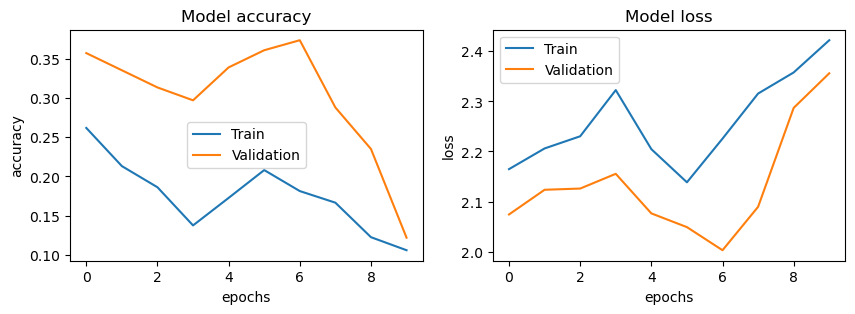

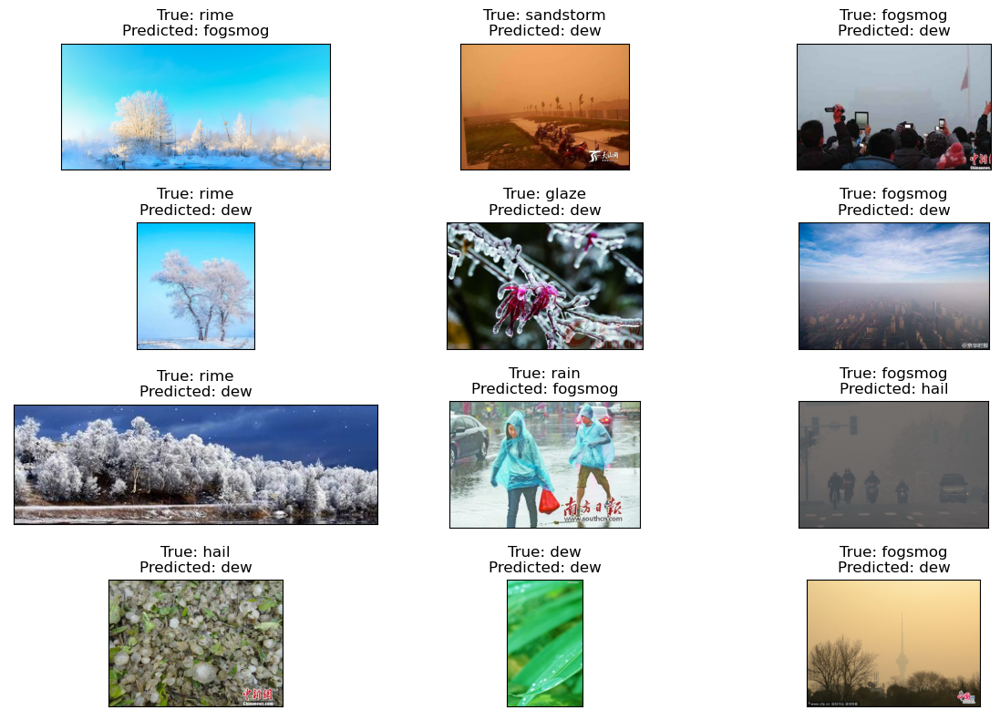

In [69]:
history=plot(history,train_gen_MobileNet,valid_gen_MobileNet,test_gen_MobileNet, ensemble_model)

# Final Conclusions and Comparisions:

- The pretrained models have performed better with the given dataset when compared to Custom CNN models


- We have included dropout regularization to avoid overfitiing and increase the performance. However, this did not yeild desired results for custom CNN models.


- The average ensembling of individual models performed poorly compared to custom CNN models.


- The classes Frost, Glaze and Snow are performing very poorly due to similarities in their features.

# Future Work

- As we are working with a limited dataset aroound 6000 images we suspect the performance and scope of the model is limited. So our work includes gathering an extensive dataset and working with different optimizing models to improv the accuracy of the model.


- Moreover, we need to work with more ensemebling algorithms using boosting and others to improve the performance of the models.

# REFERENCES

<ol>
    <li>Xiao, Haixia. “Weather Phenomenon Database (WEAPD).” Harvard Dataverse, 10 Nov. 2021, dataverse.harvard.edu/dataset.xhtml?persistentId=doi%3A10.7910%2FDVN%2FM8JQCR. </li>
    <li>“Convolutional Neural Network. Learn Convolutional Neural Network from… | by dshahid380.” Towards Data Science, 24 February 2019, https://towardsdatascience.com/covolutional-neural-network-cb0883dd6529. Accessed 8 May 2023.</li>
    <li>“Adam Optimizer for Stochastic Gradient Descent.” Shiksha.com, 2 March 2023,https://www.shiksha.com/online-courses/articles/adam-optimizer-for-stochastic-gradient-descent/. Accessed 8 May 2023.</li>
    <li> Krishnamurthy, Bharath. “ReLU Activation Function Explained.” Built In, 28 October 2022, https://builtin.com/machine-learning/relu-activation-function. Accessed 8 May 2023.</li>
    <li>Data structure for representation of big data of weather ... - IJCST. (n.d.). http://www.ijcstjournal.org/volume-3/issue-6/IJCST-V3I6P8.pdf </li>
    <li>“Image Augmentation for Deep Learning | by Suki Lau.” Towards Data Science, https://towardsdatascience.com/image-augmentation-for-deep-learning-histogram-equalization-a71387f609b2. Accessed 8 May 2023.</li>
     <li>Kaushik, Aakash, and Lyndi Castrejon. “Understanding the VGG19 Architecture.” OpenGenus IQ, https://iq.opengenus.org/vgg19-architecture/. Accessed 8 May 2023.</li>
    <li>Thakur, Rohit. “Beginners Guide to VGG16 Implementation in Keras.” Built In, 9 March 2023, https://builtin.com/machine-learning/vgg16#. Accessed 8 May 2023.</li>
    <li>https://www.ibm.com/topics/convolutional-neural-networks</li>
</ol>
